### To run scRNA-seq analysis for CRC cancer patients

Reference: https://www.nature.com/articles/s41588-020-0636-z

data source: https://ftp.ncbi.nlm.nih.gov/geo/series/GSE132nnn/GSE132465/suppl/


In [2]:
# Set up
required.packages <- c("Seurat", "dplyr", "SingleR", "celldex", "SingleCellExperiment",
                       "glue", 'readxl', 'cowplot', 'ggplot2', 'viridis', 'tidyr', 
                       'harmony',  'SeuratData', 'rio', 'Matrix', 'celldex', 'SingleR') 

# if(!requireNamespace('remotes', quietly = TRUE)){
#   install.packages('remotes')}
#   
# remotes::install_github('satijalab/azimuth', ref = 'master')
# devtools::install_github('satijalab/seurat-data')
# devtools::install_github("navinlabcode/copykat")

new.packages <- required.packages[!(required.packages %in% installed.packages()[,"Package"])]

if (!require("BiocManager", quietly = TRUE))
    install.packages("BiocManager")


if(length(new.packages) > 0 ) BiocManager::install(new.packages)

sapply(required.packages, function(pkg){suppressPackageStartupMessages(require(pkg, character.only = TRUE))})

Seurat                dplyr              SingleR 
                TRUE                 TRUE                 TRUE 
             celldex SingleCellExperiment                 glue 
                TRUE                 TRUE                 TRUE 
              readxl              cowplot              ggplot2 
                TRUE                 TRUE                 TRUE 
             viridis                tidyr              harmony 
                TRUE                 TRUE                 TRUE 
          SeuratData                  rio               Matrix 
                TRUE                 TRUE                 TRUE 
             celldex              SingleR 
                TRUE                 TRUE

In [4]:
data.dir <- "/media/josh/seagate/data/perm/scRNA_seq/Lee_CRC"

if(!dir.exists(data.dir)){
    dir.create(data.dir, recursive = T)
}

date.str <- "09212024"

project = 'Lee_CRC'

nFeature_lower <- 250
nFeature_upper <- 10000
nCount_lower <- 1000
nCount_upper <- 100000
pMT_lower <- 0
pMT_upper <- 25
pHB_lower <- 0
pHB_upper <- 5

In [5]:
# Data ref: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6530130/


URL <- 'https://ftp.ncbi.nlm.nih.gov/geo/series/GSE132nnn/GSE132465/suppl/GSE132465_GEO_processed_CRC_10X_raw_UMI_count_matrix.txt.gz'
file_name <- basename(URL)

if(!file.exists(glue('{data.dir}/{file_name}'))){
  system(sprintf("wget '%s' -P %s", URL, data.dir))
  # system(sprintf('tar -xvf %s/%s -C %s', data.dir, file_name, data.dir))
  # system(glue('rm {data.dir}/{file_name}'))
}


URL <- 'https://ftp.ncbi.nlm.nih.gov/geo/series/GSE132nnn/GSE132465/suppl/GSE132465_GEO_processed_CRC_10X_cell_annotation.txt.gz'
file_name <- basename(URL)

if(!file.exists(glue('{data.dir}/{file_name}'))){
  system(sprintf("wget '%s' -P %s", URL, data.dir))
  # system(sprintf('tar -xvf %s/%s -C %s', data.dir, file_name, data.dir))
  # system(glue('rm {data.dir}/{file_name}'))
}

URL <- 'https://ftp.ncbi.nlm.nih.gov/geo/series/GSE132nnn/GSE132465/suppl/GSE132465_GEO_processed_CRC_10X_natural_log_TPM_matrix.txt.gz'
file_name <- basename(URL)

if(!file.exists(glue('{data.dir}/{file_name}'))){
  system(sprintf("wget '%s' -P %s", URL, data.dir))
  # system(sprintf('tar -xvf %s/%s -C %s', data.dir, file_name, data.dir))
  # system(glue('rm {data.dir}/{file_name}'))
}

URL <- 'https://ftp.ncbi.nlm.nih.gov/geo/series/GSE132nnn/GSE132465/matrix/GSE132465_series_matrix.txt.gz'
file_name <- basename(URL)

if(!file.exists(glue('{data.dir}/{file_name}'))){
  system(sprintf("wget '%s' -P %s", URL, data.dir))
  # system(sprintf('tar -xvf %s/%s -C %s', data.dir, file_name, data.dir))
  # system(glue('rm {data.dir}/{file_name}'))
}




In [6]:
### Download clinical data
URL <- 'https://static-content.springer.com/esm/art%3A10.1038%2Fs41588-020-0636-z/MediaObjects/41588_2020_636_MOESM3_ESM.xlsx'
file_name <- basename(URL)

if(!file.exists(glue('{data.dir}/{file_name}'))){
  system(sprintf("wget '%s' -P %s", URL, data.dir))
  # system(sprintf('tar -xvf %s/%s -C %s', data.dir, file_name, data.dir))
  # system(glue('rm {data.dir}/{file_name}'))
}

In [7]:
clinical_dat <- readxl::read_excel(glue('{data.dir}/41588_2020_636_MOESM3_ESM.xlsx'), sheet = 2, skip = 3)


In [8]:
table(clinical_dat$`Sample type`)


Colorectal cancer              Core           KUL01-T           KUL19-T 
               23                 1                 1                 1 
          KUL21-T           KUL28-T           KUL30-T           KUL31-T 
                1                 1                 1                 1 

In [9]:
names(clinical_dat)

[1] "Normal"               "Patient"              "Tumor"               
 [4] "Sample type"          "Gender"               "Age"                 
 [7] "TNM stage"            "Stage"                "Anatomic region"     
[10] "Left/Right-sided"     "MSI"                  "Pathological subtype"
[13] "No.of mutations"      "nearestCMS (RF)"      "predictedCMS (RF)"   
[16] "KRAS"                 "BRAF"                 "TP53"                
[19] "APC"                  "SMAD4"                "Alias (Tumor)"       
[22] "Alias (Normal)"

In [10]:
clinical_dat <- clinical_dat %>% 
filter(`Sample type` == 'Colorectal cancer') %>% 
select('Patient', 'Stage', 'Anatomic region', 'MSI', 'KRAS','BRAF','TP53','APC','SMAD4')
head(clinical_dat, 3)

Patient,Stage,Anatomic region,MSI,KRAS,BRAF,TP53,APC,SMAD4
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC02,IIIB,rectum,MSS,Wildtype,Wildtype,Mutant,Mutant,Mutant
SMC03,IIIC,hepatic flexure,MSI-H,Wildtype,Mutant,Wildtype,Mutant,Wildtype


In [11]:
table(clinical_dat$MSI, useNA = 'always')


MSI-H   MSS  <NA> 
    4    19     0 

In [10]:

dat <- GEOquery::getGEO(filename=glue('{data.dir}/GSE132465_series_matrix.txt.gz'),GSEMatrix = FALSE,getGPL = FALSE)

meta <- pData(dat)

# pheno <- meta %>% select( geo_accession, source_name_ch1,  supplementary_file_1, 'tissue type:ch1')
pheno <- meta %>% select( geo_accession,   'patient_id:ch1', 'tissue type:ch1', 'pathologic:ch1')

pheno <- data.table::setnames(pheno, c('tissue type:ch1', 'patient_id:ch1', 'pathologic:ch1'), 
                              c('Class', 'patient_id', 'pathologic_grade')) %>% unique()

# # pheno$sample_name <- paste0(pheno$geo_accession, '_', pheno$title)

# # head(pheno, 1)
# pheno$Disease_type <- sapply(strsplit(gsub('.tar.gz', '', basename(pheno$supplementary_file_1)), '_'), '[', 2)
# pheno$Disease_type <- gsub('1|2', '', pheno$Disease_type)
pheno$Class[pheno$Class == 'Normal mucosa'] <- 'Normal'
pheno$Class[pheno$Class == 'Colorectal cancer'] <- 'Cancer'


Setting options('download.file.method.GEOquery'='auto')

Setting options('GEOquery.inmemory.gpl'=FALSE)



In [11]:
head(pheno)

,geo_accession,patient_id,Class,pathologic_grade
,<chr>,<chr>,<chr>,<chr>
GSM3868425,GSM3868425,SMC01,Cancer,Well differentiated
GSM3868426,GSM3868426,SMC02,Cancer,Well differentiated
GSM3868427,GSM3868427,SMC03,Cancer,Poorly differntiated
GSM3868428,GSM3868428,SMC04,Cancer,Moderately differenttiated
GSM3868429,GSM3868429,SMC05,Cancer,Well differentiated with mucin production (<10%)
GSM3868430,GSM3868430,SMC06,Cancer,Well differentiated


In [12]:
table(pheno$Histology)

< table of extent 0 >

In [ ]:
cnts <- read.table(glue('{data.dir}/GSE132465_GEO_processed_CRC_10X_raw_UMI_count_matrix.txt.gz'), sep = "\t", row.names=1, header=T)
cnts <- Matrix(as.matrix(cnts), sparse=T)

In [9]:
seu_obj <- CreateSeuratObject(counts = cnts, project = project, min.cells = 3, min.features = 200)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [10]:
ann <- read.table(glue('{data.dir}/GSE132465_GEO_processed_CRC_10X_cell_annotation.txt.gz'), sep = '\t', header = T, row.names=1)
row.names(ann) <- gsub('-', '.', row.names(ann))

In [11]:
head(ann, 2)

,Patient,Class,Sample,Cell_type,Cell_subtype
,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2
SMC01.T_AAACCTGGTCGCATAT,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2


In [12]:
head(seu_obj@meta.data, 2)

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268


In [13]:
if( all(row.names(seu_obj@meta.data) == row.names(ann))){
    seu_obj <- AddMetaData(seu_obj, metadata = ann)


}

In [14]:
head(seu_obj@meta.data, 2)

,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2


In [15]:
seu_obj

An object of class Seurat 
25655 features across 63689 samples within 1 assay 
Active assay: RNA (25655 features, 0 variable features)
 2 layers present: counts, data

In [16]:
gc()
### calculate mitochondrial, hemoglobin and ribosomal gene counts
seu_obj <- PercentageFeatureSet(seu_obj, pattern = "^MT-", col.name = "pMT")
seu_obj <- PercentageFeatureSet(seu_obj, pattern = "^HBA|^HBB", col.name = "pHB")
seu_obj <- PercentageFeatureSet(seu_obj, pattern = "^RPS|^RPL", col.name = "pRP")

# Data Filtering 

seu_obj_filtered <- subset(seu_obj, subset = nFeature_RNA > nFeature_lower & nFeature_RNA < nFeature_upper & pMT < pMT_upper )


seu_obj_filtered

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,9732947,519.8,17538792,936.7,17538792,936.7
Vcells,377635844,2881.2,4343612956,33139.2,5429497869,41423.8


An object of class Seurat 
25655 features across 63638 samples within 1 assay 
Active assay: RNA (25655 features, 0 variable features)
 2 layers present: counts, data

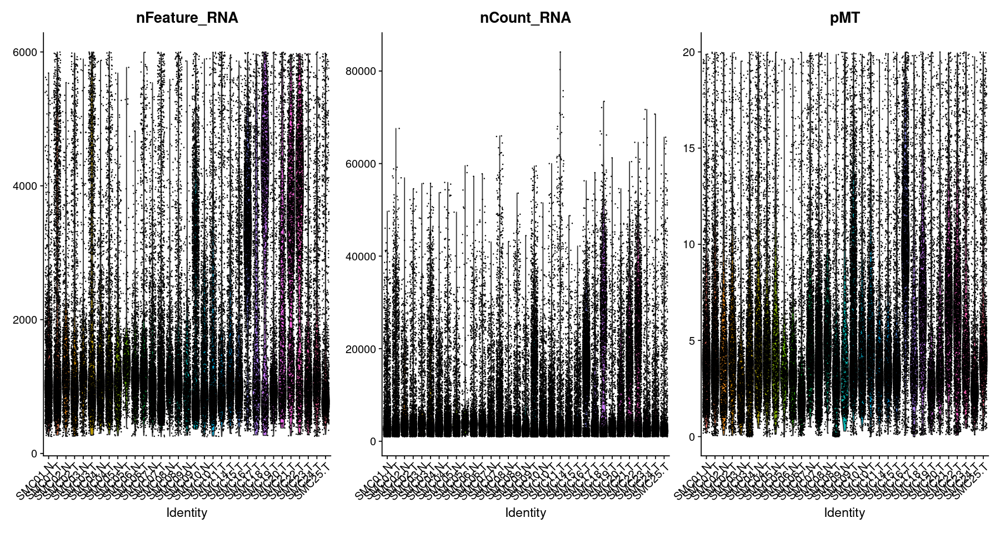

In [17]:
options(repr.plot.width = 15, repr.plot.height = 8)
VlnPlot(seu_obj_filtered, features = c("nFeature_RNA", "nCount_RNA", "pMT"), ncol = 3)

In [18]:
# Data normalization
gc()
# seu_obj_filtered <- SCTransform(seu_obj_filtered, verbose = FALSE, vars.to.regress = c("nCount_RNA", "pMT"))
seu_obj_filtered <- SCTransform(seu_obj_filtered, verbose = FALSE, vars.to.regress = c("nCount_RNA", "pMT"))

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,9941520,531.0,17538792,936.7,17538792,936.7
Vcells,739138849,5639.2,3474890365,26511.4,5429497869,41423.8


,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,10018654,535.1,17538792,936.7,17538792,936.7
Vcells,1158102567,8835.7,6935034909,52910.2,8668762993,66137.5


Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 3181900)”


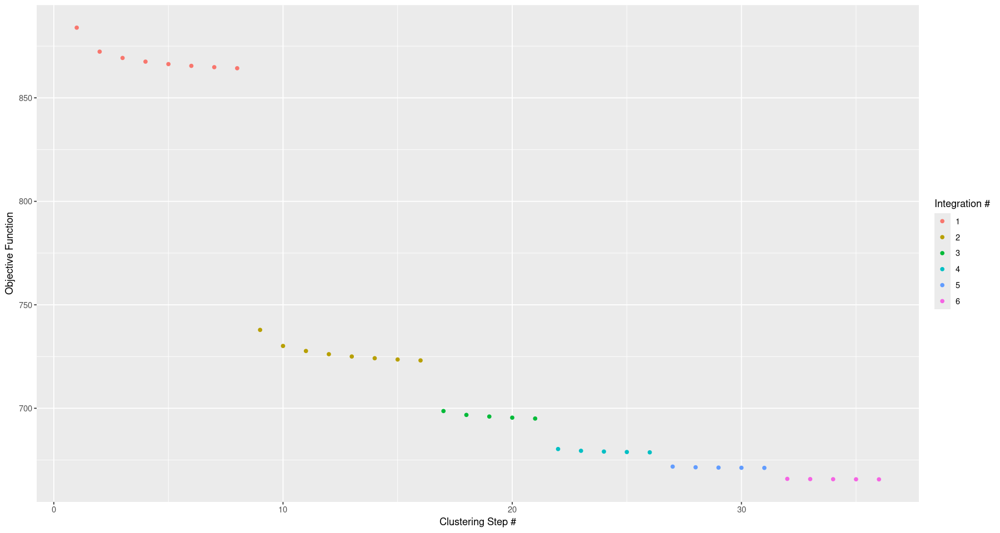

In [19]:

gc()
# Dimensionality reduction
seu_obj_filtered <- RunPCA(seu_obj_filtered, verbose = FALSE)

seu_obj_filtered <- seu_obj_filtered %>% 
    RunHarmony("orig.ident", plot_convergence = TRUE, assay.use = "SCT", verbose = FALSE)


In [4]:

# seu_obj_filtered <- RunUMAP(seu_obj_filtered, reduction = "harmony")
seu_obj_filtered <- seu_obj_filtered %>% 
    RunUMAP(reduction = "harmony", dims = 1:20, verbose = FALSE) %>% 
    FindNeighbors(reduction = "harmony", dims = 1:20, verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


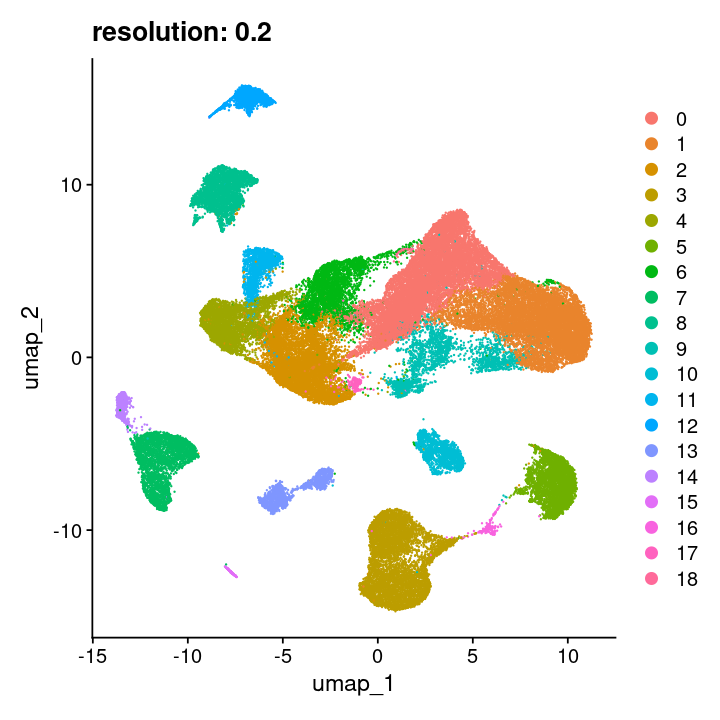

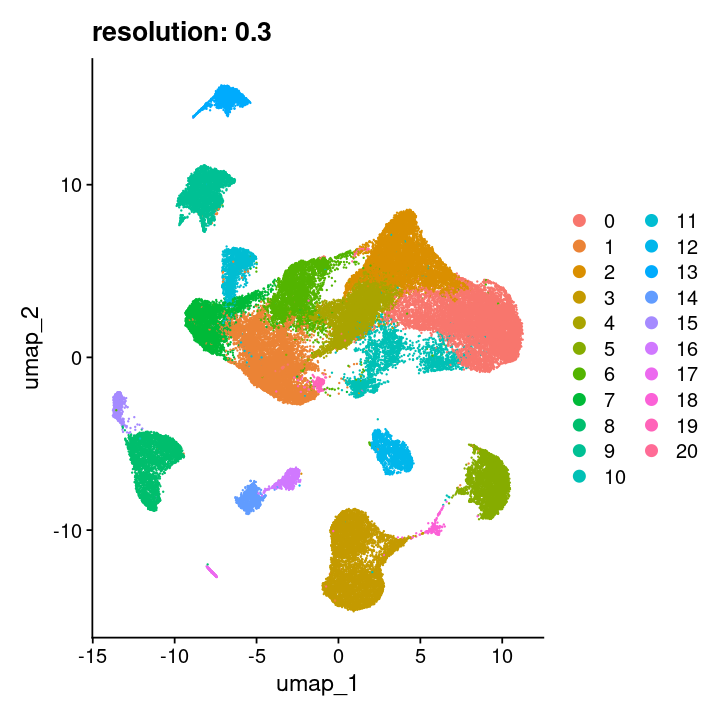

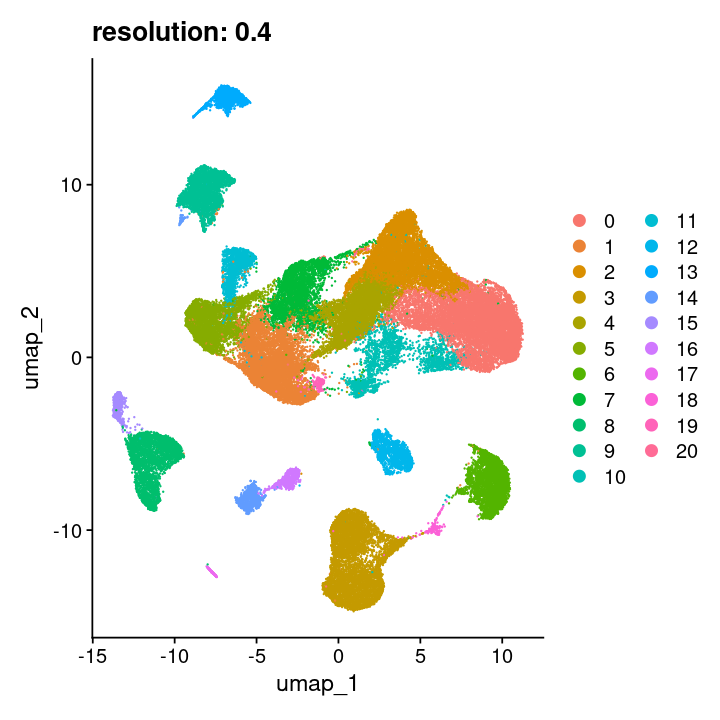

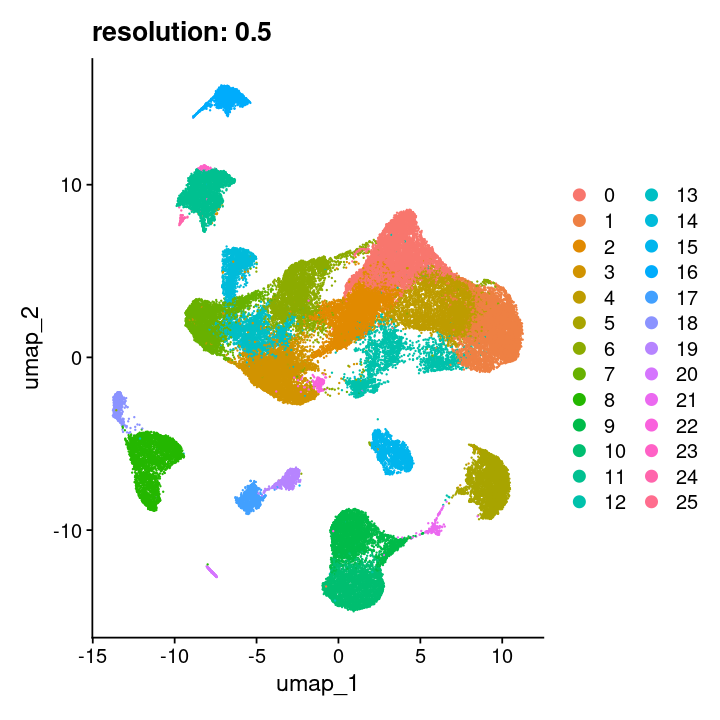

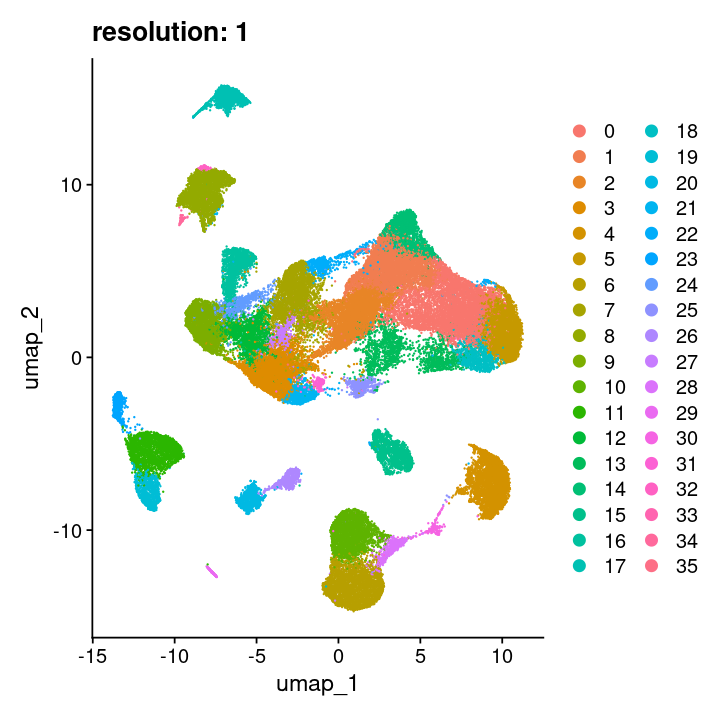

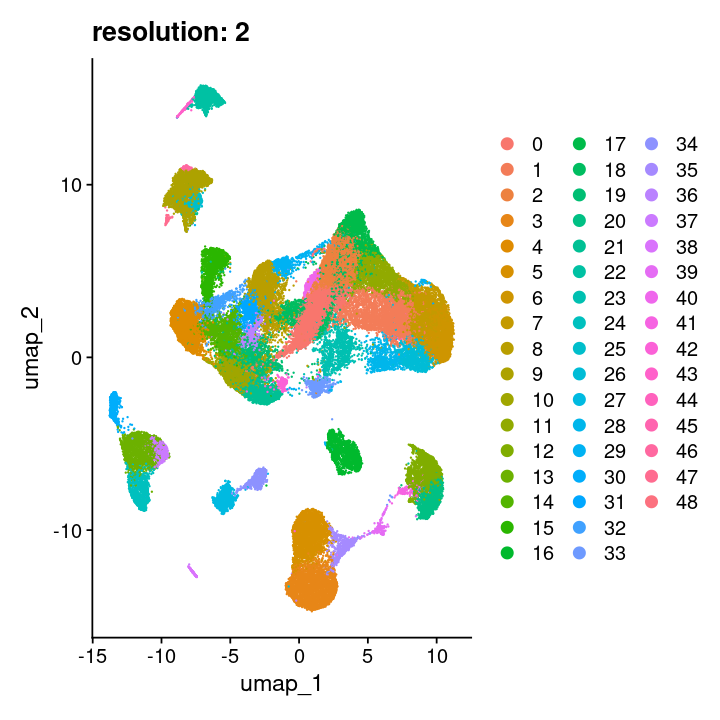

In [5]:
options(repr.plot.width = 6, repr.plot.height = 6)
# Data normalization
# gc()
# seu_obj_filtered <- SCTransform(seu_obj_filtered, verbose = FALSE, vars.to.regress = c("nCount_RNA", "pMT"), conserve.memory = T)

for (i in c(0.2, 0.3, 0.4, 0.5, 1, 2)) {
  seu_obj_filtered <- FindClusters(seu_obj_filtered, resolution = i, verbose = FALSE)
  print(DimPlot(seu_obj_filtered, reduction = "umap") + labs(title = paste0("resolution: ", i)))
}



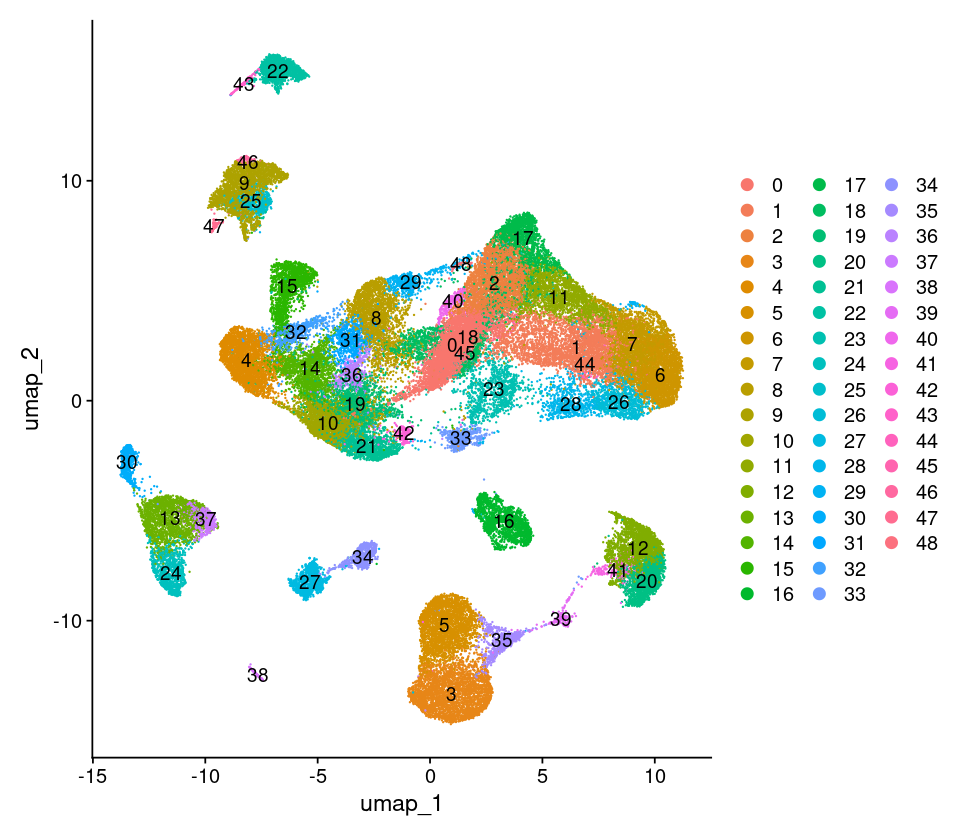

In [6]:
options(repr.plot.width = 8, repr.plot.height = 7)

DimPlot(seu_obj_filtered, label = TRUE)

In [12]:
# saveRDS(seu_obj_filtered, glue('{data.dir}/Lee_CRC_cancer.rds'))
seu_obj_filtered <- readRDS(glue('{data.dir}/Lee_CRC_cancer.rds'))

In [13]:
head(seu_obj_filtered@meta.data, 2)

,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,pHB,pRP,nCount_SCT,nFeature_SCT,SCT_snn_res.0.2,seurat_clusters,SCT_snn_res.0.3,SCT_snn_res.0.4,SCT_snn_res.0.5,SCT_snn_res.1,SCT_snn_res.2
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,12.921791,0,23.12625,4581,1578,6,8,6,7,6,7,8
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,8.761481,0,23.15556,4758,2014,6,8,6,7,6,7,8


In [14]:
seu_obj_filtered

An object of class Seurat 
50207 features across 63638 samples within 2 assays 
Active assay: SCT (24552 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

In [15]:
cell_meta <- seu_obj_filtered@meta.data %>% select('Patient') 
cell_meta$ID <- row.names(cell_meta)
cell_meta <- merge(cell_meta, clinical_dat, by = 'Patient', all.x = T)
row.names(cell_meta) <- cell_meta$ID
cell_meta$ID <- NULL
cell_meta<- cell_meta[row.names(seu_obj_filtered@meta.data), ]

In [16]:
head(cell_meta, 3)

,Patient,Stage,Anatomic region,MSI,KRAS,BRAF,TP53,APC,SMAD4
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGGTCGCATAT,SMC01,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGTCCCTTGCA,SMC01,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype


In [17]:
table(cell_meta$MSI, useNA = 'always')


MSI-H   MSS  <NA> 
12198 51440     0 

In [18]:
if( all(row.names(seu_obj_filtered@meta.data) == row.names(cell_meta))){
    seu_obj_filtered <- AddMetaData(seu_obj_filtered, metadata = cell_meta)

}
head(seu_obj_filtered@meta.data, 3)

,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,pHB,⋯,SCT_snn_res.1,SCT_snn_res.2,Stage,Anatomic region,MSI,KRAS,BRAF,TP53,APC,SMAD4
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,⋯,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,12.921791,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,8.761481,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGTCCCTTGCA,SMC01.T,7356,1714,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,19.711800,0,⋯,8,25,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype


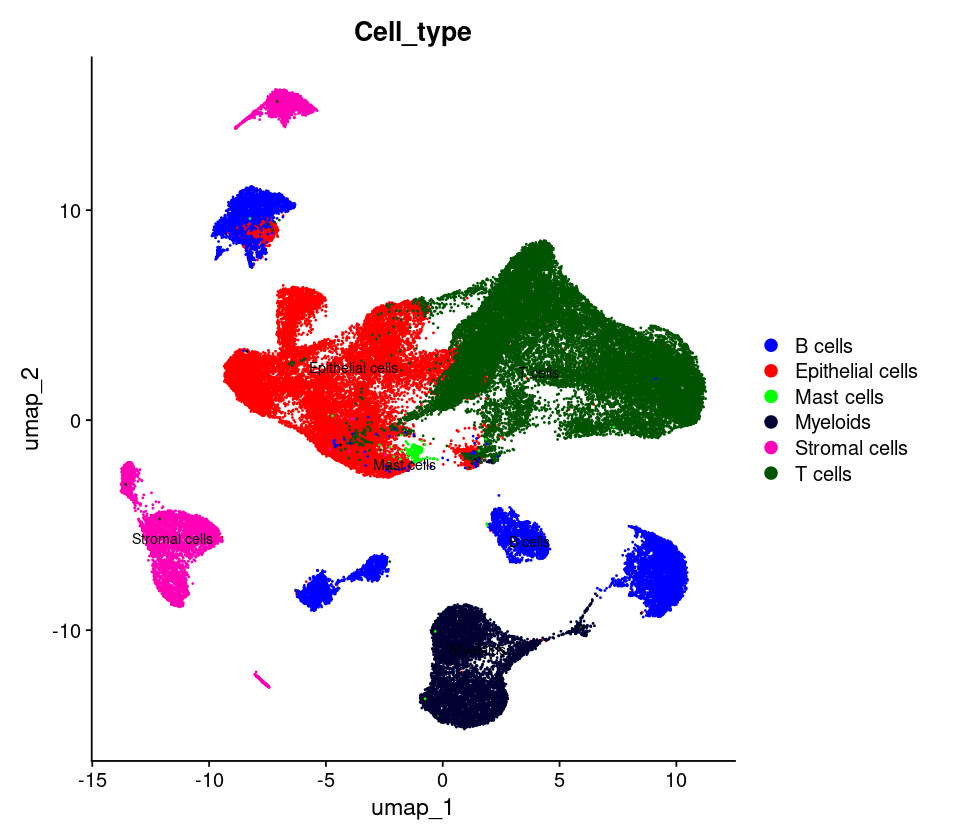

In [19]:
options(repr.plot.width = 8, repr.plot.height = 7)
n_colors <- length(levels(as.factor(seu_obj_filtered@meta.data$Cell_type)))
colors <- DiscretePalette(n_colors, palette = "glasbey")
DimPlot(seu_obj_filtered, group.by = "Cell_type", label = TRUE, label.size = 3, cols = colors, repel = T)


In [21]:
table(seu_obj_filtered@meta.data$Class)


Normal  Tumor 
 16385  47253 

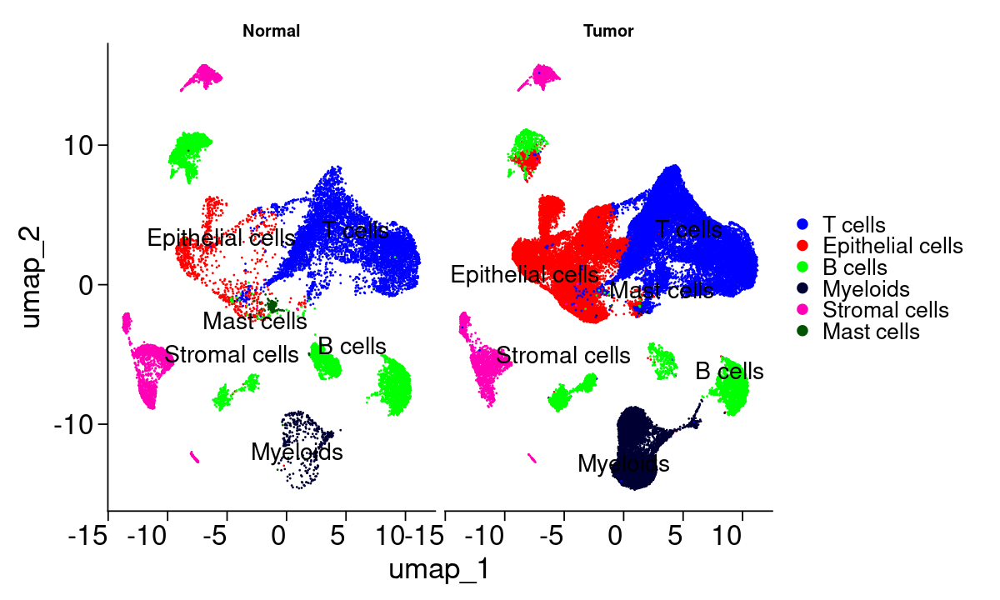

In [18]:
options(repr.plot.width = 10, repr.plot.height = 6)
cell_types <- table(seu_obj_filtered$Cell_type) %>% prop.table() %>% sort(decreasing = T) %>% names()
seu_obj_filtered@meta.data$Class <- factor(seu_obj_filtered@meta.data$Class, levels = c('Normal', 'Tumor'))
seu_obj_filtered@meta.data$Cell_type <- factor(seu_obj_filtered@meta.data$Cell_type, levels = cell_types)
n_colors <- length(cell_types)
colors <- DiscretePalette(n_colors, palette = "glasbey")
Idents(seu_obj_filtered) <- 'Cell_type'
# DimPlot(seu_obj_filtered, group.by = "bpe_cellTypes", label = TRUE, label.size = 3, cols = colors, repel = T, split.by = 'tumor_site')
DimPlot(seu_obj_filtered, label = TRUE, 
        label.size = 6, 
        cols = colors, repel = T, 
        split.by = 'Class') +
    theme(axis.ticks.length=unit(.25, "cm"),
          axis.text.x = element_text(size = 20,  hjust=1),
          axis.text.y = element_text(size = 20),  
          axis.title.x = element_text( size = 21),
          axis.title.y = element_text(size = 21), 
          axis.line = element_line( linewidth = 0.5), 
          legend.title=element_text(size=18),  
          legend.text=element_text(size=16))

In [21]:
table(seu_obj_filtered@meta.data$Cell_type, seu_obj_filtered@meta.data$`SCT_snn_res.0.2`)  %>% 
as.data.frame() %>% filter(Var2 == 0) %>% arrange(desc(Freq)) %>% head(6)

,Var1,Var2,Freq
,<fct>,<fct>,<int>
1,T cells,0,11023
2,Epithelial cells,0,1315
3,B cells,0,2
4,Myeloids,0,0
5,Stromal cells,0,0
6,Mast cells,0,0


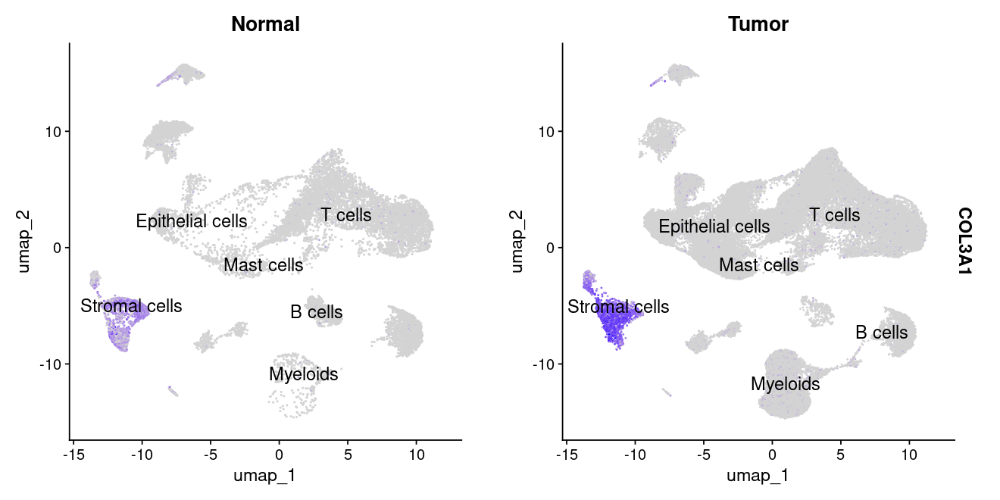

In [39]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'COL3A1')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

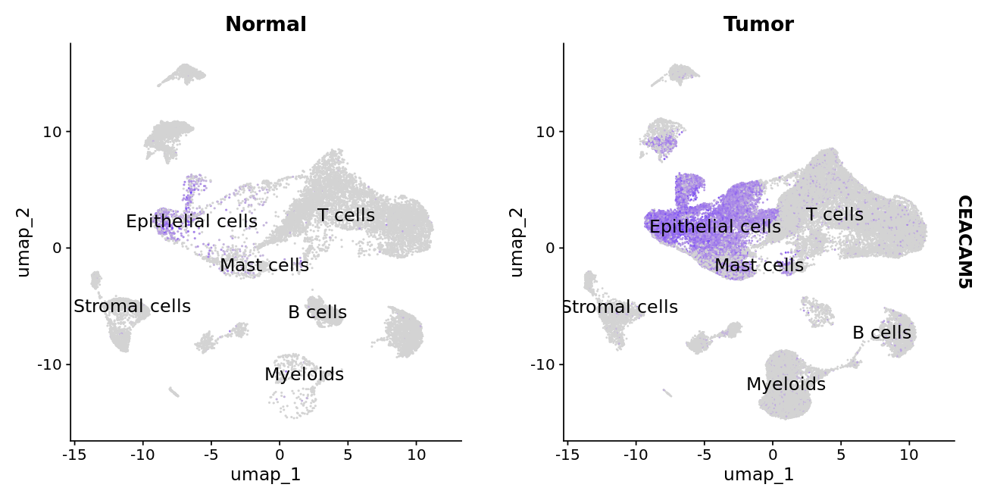

In [22]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'CEACAM5')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

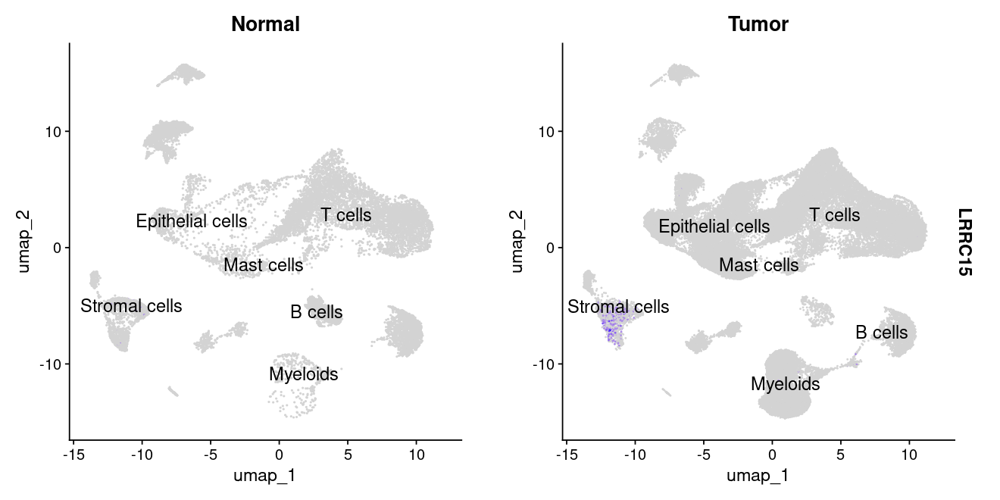

In [22]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'LRRC15')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

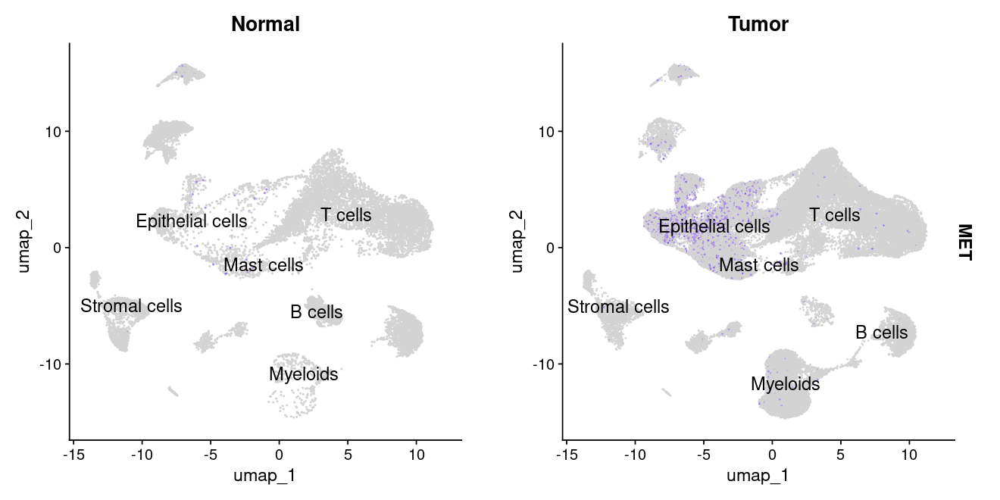

In [23]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'MET')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

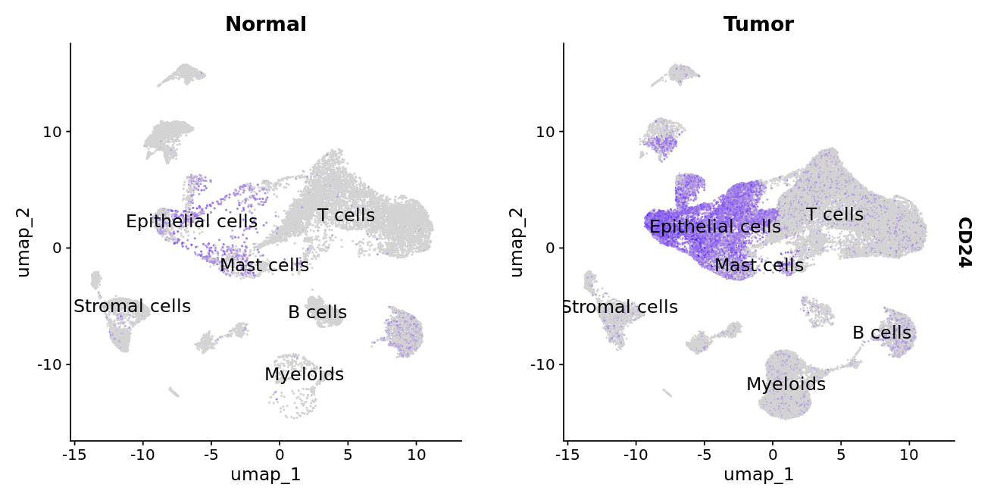

In [16]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'CD24')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

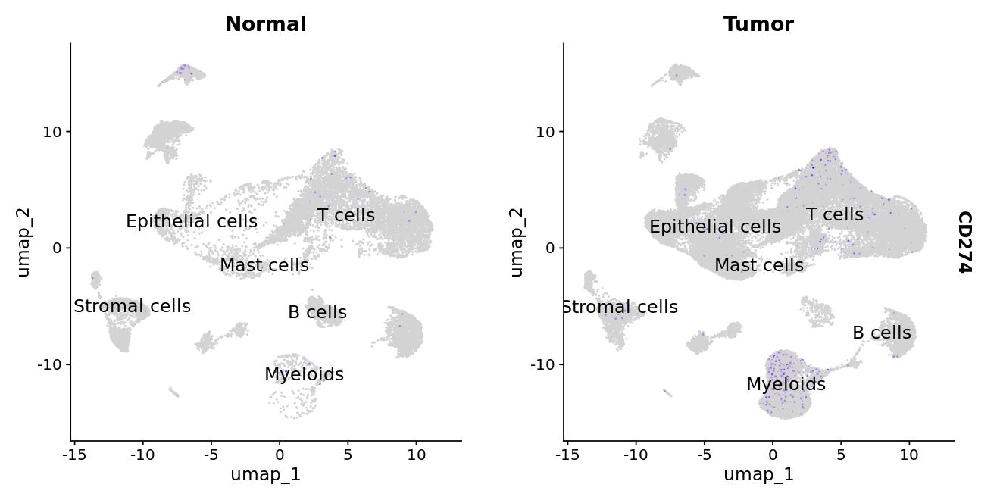

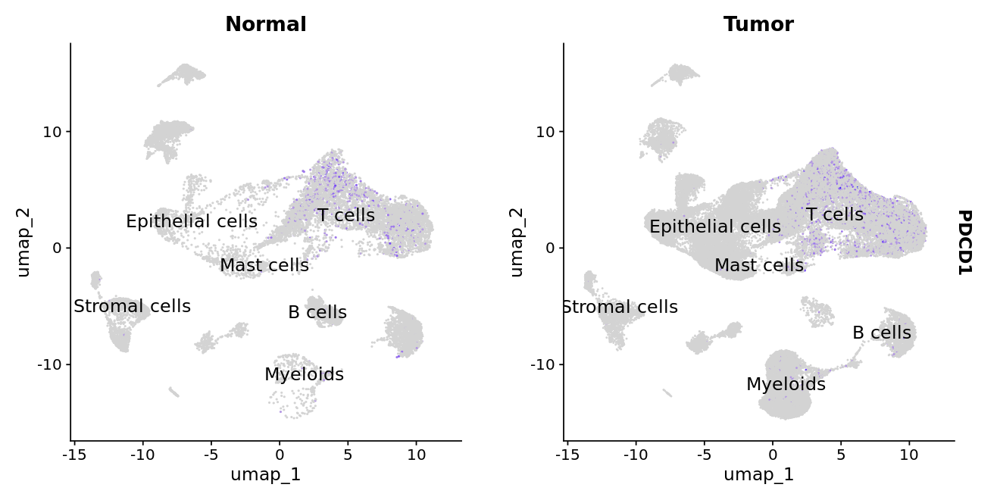

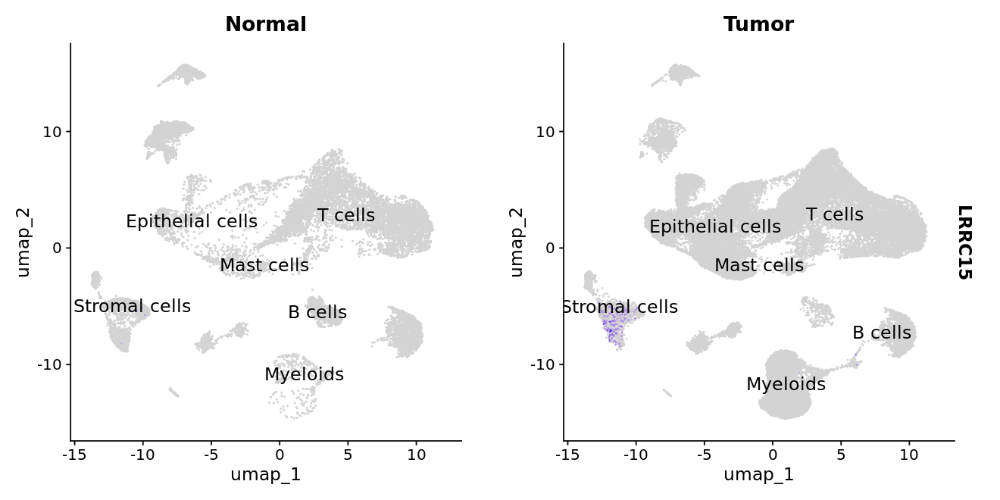

In [18]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'CD274', 'PDCD1', 'LRRC15')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

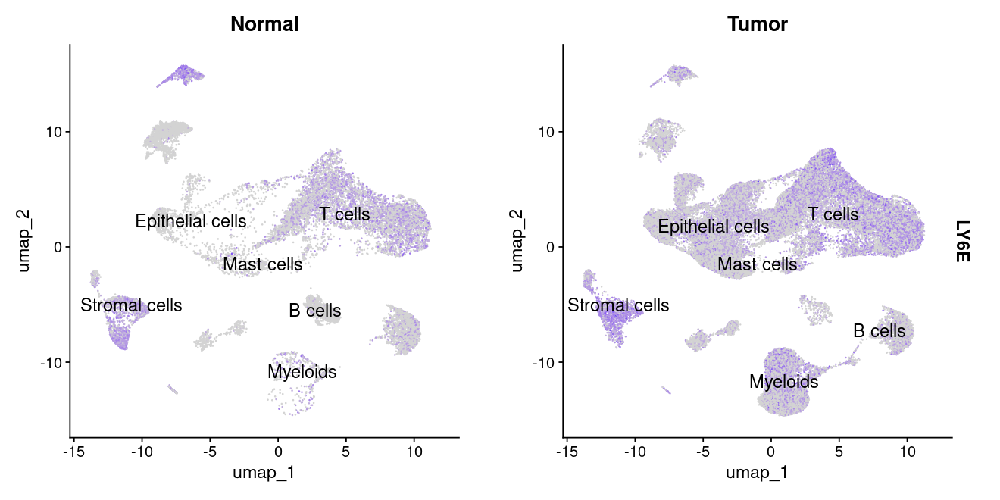

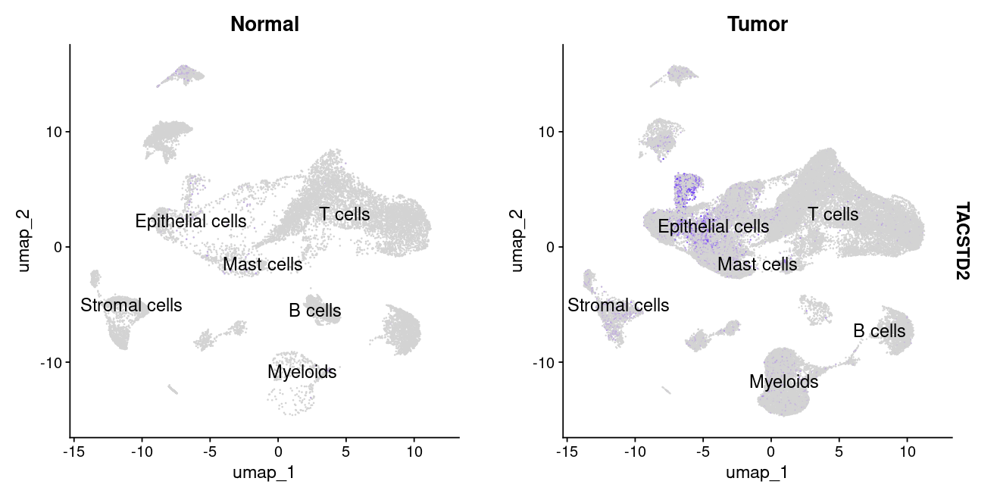

In [21]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'LY6E', 'TACSTD2')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

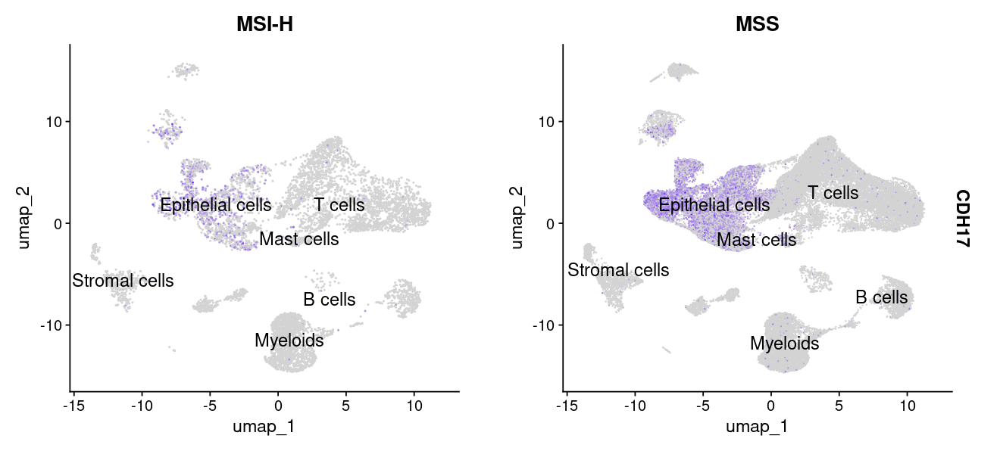

In [17]:
options(repr.plot.width = 11, repr.plot.height = 5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'CDH17')){
  
  print(FeaturePlot(subset(seu_obj_filtered, Class == 'Tumor'), split.by = 'MSI', features = gene, label = T, label.size = 5))
  
}

In [19]:
gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")

gene_of_interest <- 'L1CAM'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(seu_obj_filtered@meta.data, gene_exp_sub, by = 'row.names')


In [23]:
options(repr.plot.width = 18, repr.plot.height = 7)

df.Normal <- df %>% filter((Class == 'Normal') & (Gene_cat == 'Positive') ) %>% {table( .$Cell_type, .$Gene_cat)} %>% 
prop.table() %>% as.data.frame()

df.Normal$Cell_type <- 'Normal'

df.Cancer <- df %>% filter((Class == 'Tumor') & (Gene_cat == 'Positive')) %>% {table( .$Cell_type, .$Gene_cat)} %>% 
prop.table() %>% as.data.frame() 
df.Cancer$Cell_type <- 'Tumor'

cell.sorted <- levels(df.Cancer$Cell_type)

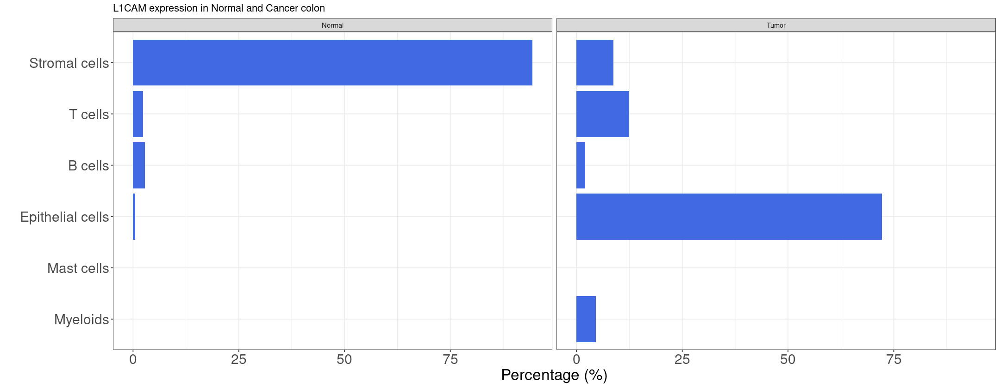

In [24]:
plot.df <- rbind(df.Normal, df.Cancer) %>% filter(Var2 == 'Positive') %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + facet_wrap(~Cell_type) +
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in Normal and Cancer colon'),
        x = "",
        y = "Percentage (%)")


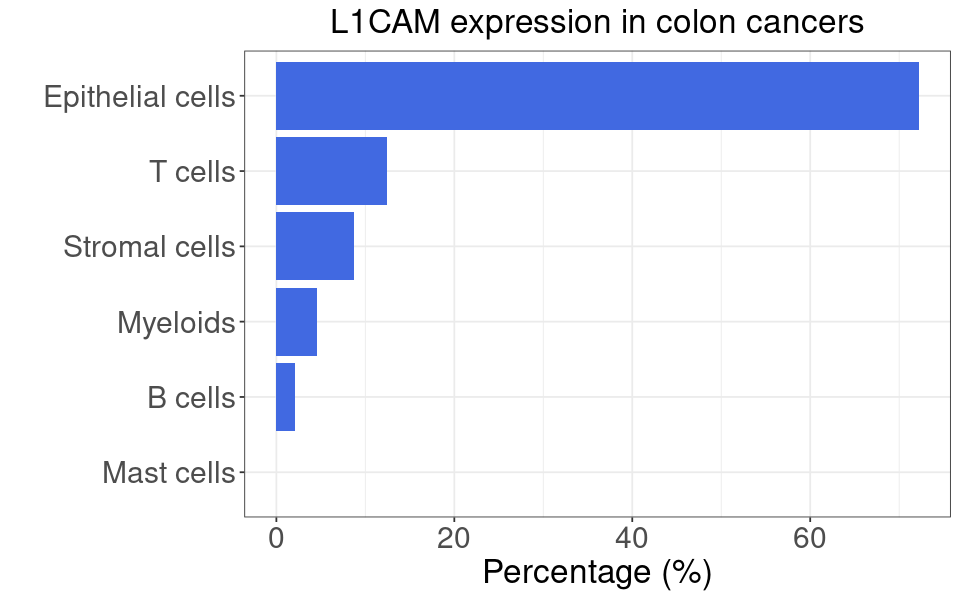

In [25]:
options(repr.plot.width = 8, repr.plot.height = 5)
df.Cancer$Freq <- df.Cancer$Freq * 100
df.Cancer <- df.Cancer %>% arrange(Freq)
cell.sorted2 <- unique(df.Cancer$Var1)
df.Cancer$Var1 <- factor(df.Cancer$Var1, levels = cell.sorted2)


ggplot(df.Cancer, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') +
coord_flip() +
    labs(title = glue('{gene_of_interest} expression in colon cancers'),
        x = "",
        y = "Percentage (%)") +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), plot.title = element_text(size = 20, hjust = 0.5), 
          legend.position="none") 


In [26]:
df.Cancer

Var1,Var2,Freq,Cell_type
<fct>,<fct>,<dbl>,<chr>
Mast cells,Positive,0.000000,Tumor
B cells,Positive,2.074689,Tumor
Myeloids,Positive,4.564315,Tumor
Stromal cells,Positive,8.713693,Tumor
T cells,Positive,12.448133,Tumor
Epithelial cells,Positive,72.199170,Tumor


In [14]:
# Extract the lognormazed expression matrix for CCR8 and FOXP3
gene_list <- c('LGR5',  'EGFR', 'MET')

cnt <- GetAssayData(object = seu_obj_filtered, slot = "data")[gene_list, ]

cnt <- as.data.frame(t(cnt))

df = merge(seu_obj_filtered@meta.data, cnt, by = 'row.names')
head(df, 2)

Warning message:
"The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead."


,Row.names,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,⋯,SCT_snn_res.0.2,seurat_clusters,SCT_snn_res.0.3,SCT_snn_res.0.4,SCT_snn_res.0.5,SCT_snn_res.1,SCT_snn_res.2,LGR5,EGFR,MET
,<I<chr>>,<fct>,<dbl>,<int>,<chr>,<fct>,<chr>,<fct>,<chr>,<dbl>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>
1,SMC01.N_AAACCTGGTGTAATGA,SMC01.N,2988,953,SMC01,Normal,SMC01-N,T cells,CD4+ T cells,5.321285,⋯,0,2,2,2,0,1,2,0,0,0
2,SMC01.N_AAACCTGTCACCTCGT,SMC01.N,5733,1484,SMC01,Normal,SMC01-N,T cells,CD4+ T cells,2.145474,⋯,0,2,2,2,0,1,2,0,0,0


In [19]:

df.sub <- df %>% filter((Cell_type == 'Epithelial cells') & (Class == 'Tumor'))
write.table(df.sub, "data/count_matrix.select_gene_exp.tsv", quote = F,
           col.names =T, row.names = F, append = F, sep = "\t")

In [18]:
table(df$Class)


Normal  Tumor 
 16385  47253 

Warning message:
"The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead."


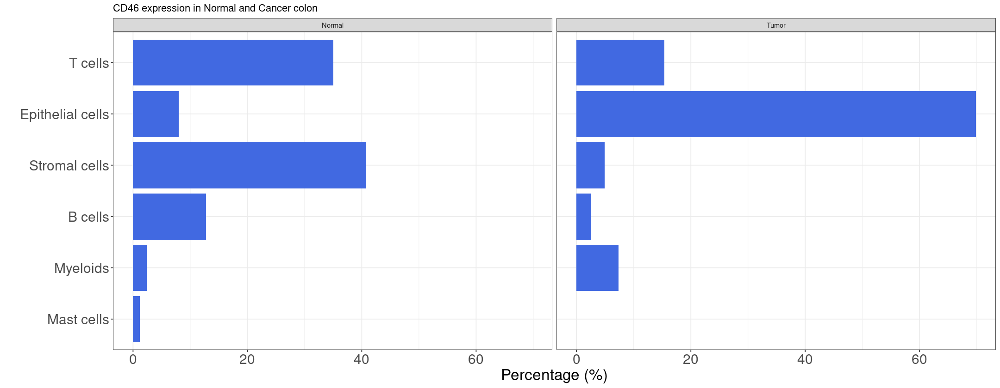

In [11]:
options(repr.plot.width = 18, repr.plot.height = 7)
gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")

gene_of_interest <- 'CD46'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(seu_obj_filtered@meta.data, gene_exp_sub, by = 'row.names')



df.Normal <- df %>% filter((Class == 'Normal') & (Gene_cat == 'Positive') ) %>% {table( .$Cell_type, .$Gene_cat)} %>% 
prop.table() %>% as.data.frame()

df.Normal$Cell_type <- 'Normal'

df.Cancer <- df %>% filter((Class == 'Tumor') & (Gene_cat == 'Positive')) %>% {table( .$Cell_type, .$Gene_cat)} %>% 
prop.table() %>% as.data.frame() 
df.Cancer$Cell_type <- 'Tumor'

cell.sorted <- levels(df.Cancer$Cell_type)

plot.df <- rbind(df.Normal, df.Cancer) %>% filter(Var2 == 'Positive') %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + facet_wrap(~Cell_type) +
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in Normal and Cancer colon'),
        x = "",
        y = "Percentage (%)")


In [34]:
length(df %>% filter(Class == 'Tumor') %>% pull(Sample) %>% unique())

[1] 23

In [35]:
length(df %>% filter(Class == 'Normal') %>% pull(Sample) %>% unique())

[1] 10

In [18]:
meta.df <- seu_obj_filtered@meta.data
head(meta.df, 2)

,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,pHB,⋯,SCT_snn_res.1,SCT_snn_res.2,Stage,Anatomic region,MSI,KRAS,BRAF,TP53,APC,SMAD4
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,⋯,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,12.921791,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,8.761481,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype


In [53]:
table(meta.df$Class)


Normal  Tumor 
 16385  47253 

In [54]:
table(meta.df$Cell_type)


         B cells Epithelial cells       Mast cells         Myeloids 
            9117            18532              187             6754 
   Stromal cells          T cells 
            5933            23115 

`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.


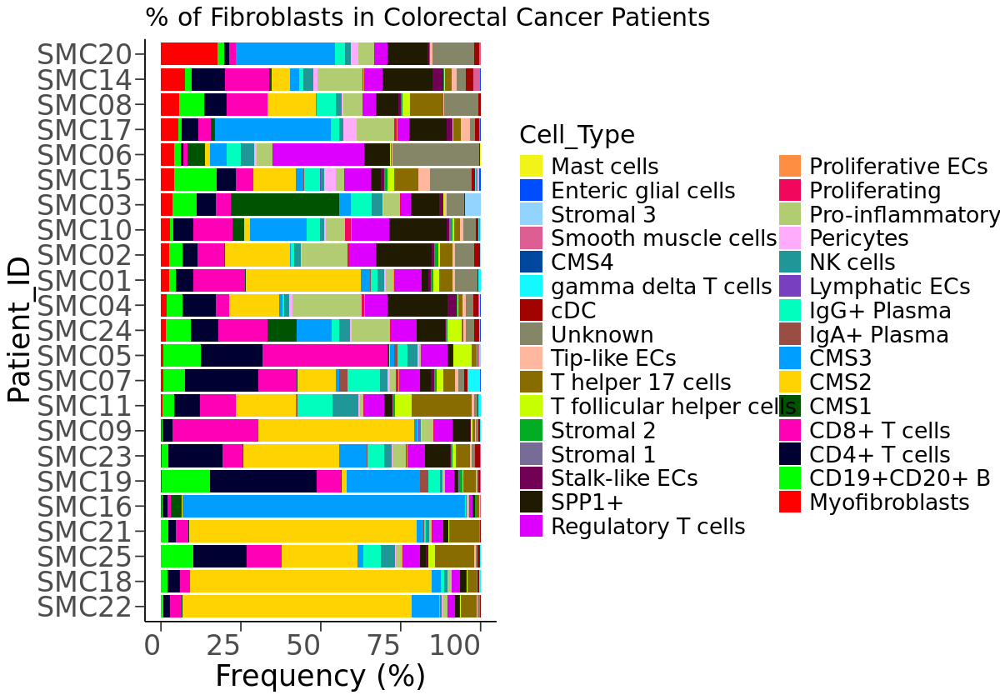

In [33]:
meta.df <- seu_obj_filtered@meta.data
plot.df <- meta.df %>% filter(Class == 'Tumor') %>%  group_by(Patient, Cell_subtype) %>%
  summarise(n = n()) %>%
  mutate(freq = n / sum(n))
plot.df$freq <- 100 * plot.df$freq

patients.sorted <- plot.df %>% filter(Cell_subtype == 'Myofibroblasts') %>% arrange(freq) %>% pull(Patient)
plot.df$Patient <- factor(plot.df$Patient, levels = patients.sorted)

options(repr.plot.width = 10, repr.plot.height = 7)
cell.types <- unique(plot.df$Cell_subtype)

cell.type.factors <- rev(unique(c('Myofibroblasts', 'Epithelial cells', cell.types)))

n_colors <- length(cell.type.factors)
colors <- rev(DiscretePalette(n_colors, palette = "glasbey"))
plot.df$Cell_subtype <- factor(plot.df$Cell_subtype, levels = cell.type.factors)

ggplot(plot.df, aes(x = Patient, y = freq, fill = Cell_subtype)) +
       geom_bar(stat = 'identity') + 
scale_fill_manual(name="Cell_Type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts in Colorectal Cancer Patients'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18)) 


`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.


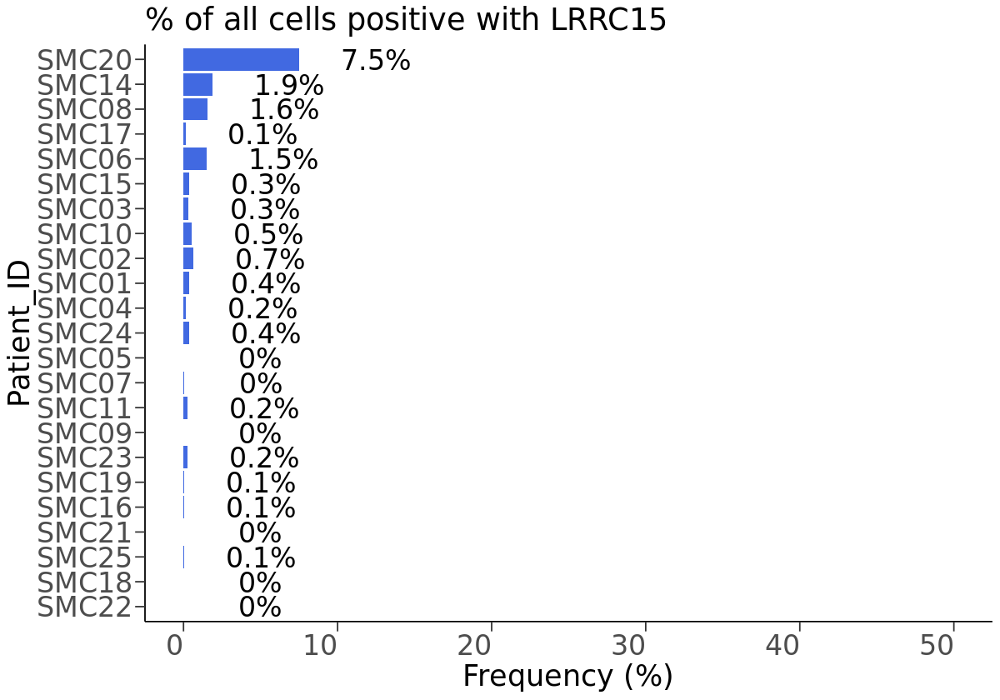

In [34]:
gene_exp <- GetAssayData(object = subset(seu_obj_filtered, Class == 'Tumor'), slot = "data")
# gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")
gene_of_interest <- 'LRRC15'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(subset(seu_obj_filtered, Class == 'Tumor')@meta.data, gene_exp_sub, by = 'row.names')
# df.Cancer <- df %>% filter(celltype_major !='Normal Epithelial') %>% filter(Gene_cat == 'Positive') %>% {table( .$celltype_major)} %>% 
# prop.table() %>% as.data.frame() %>% arrange(Freq)

tmp.df <- df %>% group_by(Patient, Gene_cat) %>% summarise(n = n()) %>%
  mutate(freq = n / sum(n))
tmp.df <- tmp.df[, 'Patient', drop = F] %>% unique()

df.all.cells <- df %>% group_by(Patient, Gene_cat) %>% summarise(n = n()) %>%
  mutate(freq = n / sum(n)) %>% filter(Gene_cat == 'Positive') 
df.all.cells <- merge(tmp.df, df.all.cells, by = 'Patient', all.x = T) %>% arrange(freq)
df.all.cells$freq[is.na(df.all.cells$freq)] <- 0
rio::export(df.all.cells, 'LRRC15_positivity_all_cells.CRC.csv')
# patients.sorted <- df.all.cells$Patient
df.all.cells$Patient <- factor(df.all.cells$Patient, levels = patients.sorted)
df.all.cells$freq <- df.all.cells$freq *100
df.all.cells$label <- paste0(round(df.all.cells$freq, 1), '%')

ggplot(df.all.cells, aes(x = Patient, y = freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
geom_text(aes(label= label), nudge_y = 5, size = 7) +
# scale_fill_manual(name="Cell_Type", values=colors) + 
scale_y_continuous(limits = c(0, 50)) +
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of all cells positive with LRRC15'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22))

In [21]:
seu_obj_cancer <- subset(seu_obj_filtered, Class == 'Tumor')

In [22]:
head(seu_obj_cancer@meta.data, 2)

,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,pHB,⋯,SCT_snn_res.1,SCT_snn_res.2,Stage,Anatomic region,MSI,KRAS,BRAF,TP53,APC,SMAD4
,<fct>,<dbl>,<int>,<chr>,<fct>,<chr>,<fct>,<chr>,<dbl>,<dbl>,⋯,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,12.921791,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,8.761481,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype


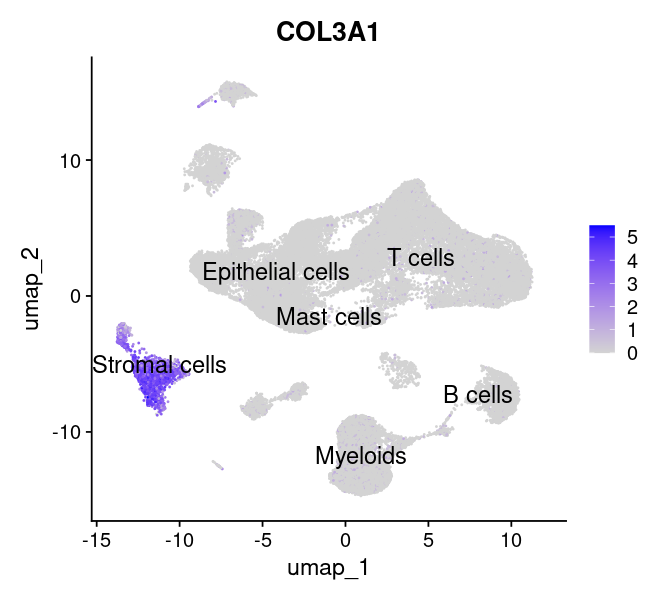

In [40]:
options(repr.plot.width = 5.5, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
# seu_obj_cancer$MSI <- factor(seu_obj_cancer$MSI, levels = c('MSS', 'MSI-H'))
for(gene in  c( 'COL3A1')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene,  label = T, label.size = 5))
  
}

Picking joint bandwidth of 0.0846

Picking joint bandwidth of 1.73e-06

Picking joint bandwidth of 0.0239

Picking joint bandwidth of 1.71e-06



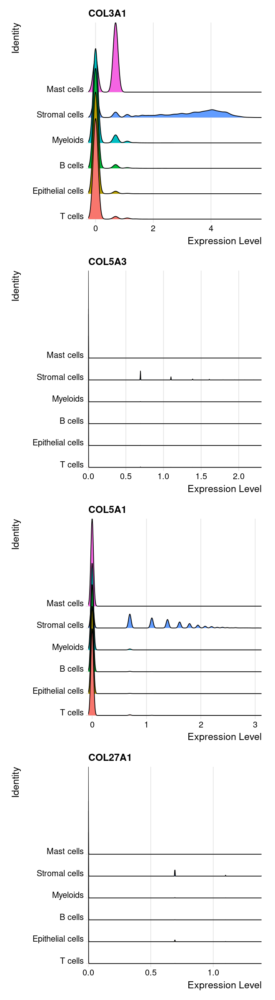

In [45]:
genes <- c('COL3A1', 'COL5A3', 'COL5A1', 'COL27A1')
options(repr.plot.width = 5.5, repr.plot.height = 20)
Idents(seu_obj_cancer) <- 'Cell_type'

RidgePlot(seu_obj_cancer, features = genes, ncol = 1)

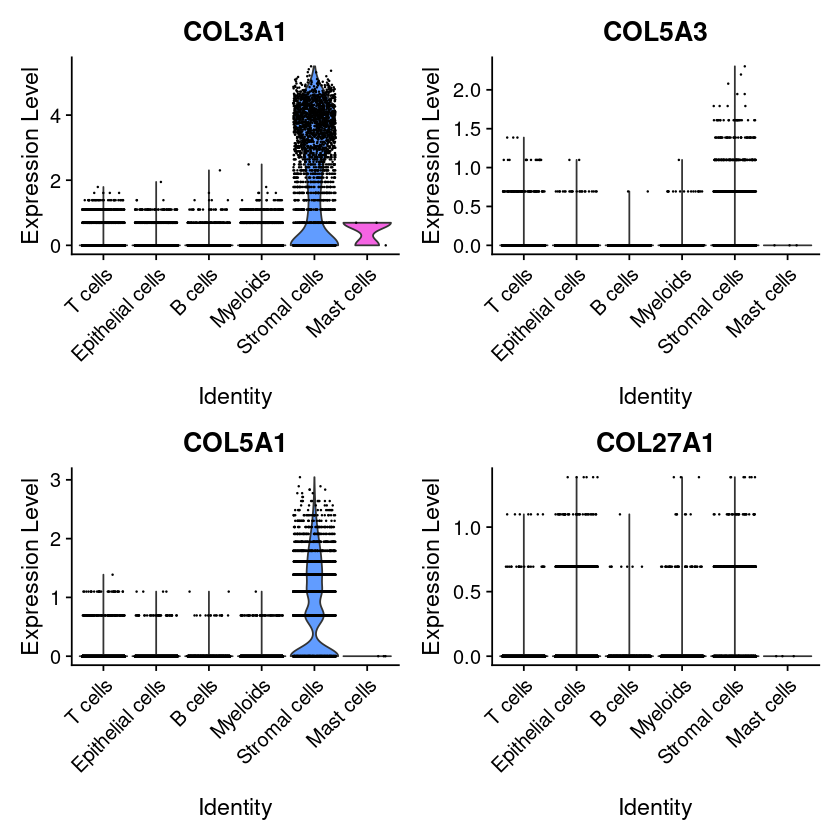

In [47]:

genes <- c('COL3A1', 'COL5A3', 'COL5A1', 'COL27A1')
options(repr.plot.width = 7, repr.plot.height = 7)
Idents(seu_obj_cancer) <- 'Cell_type'
VlnPlot(seu_obj_cancer, features = genes, ncol = 2)


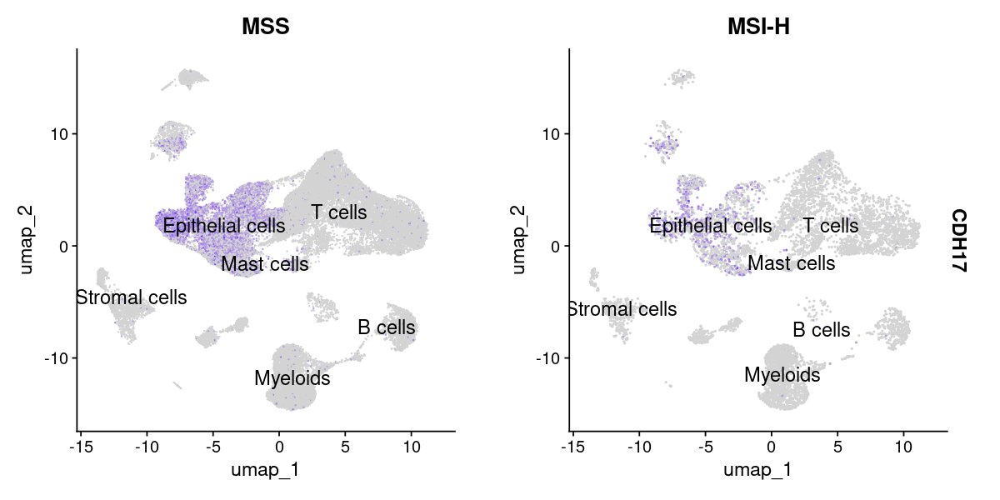

In [28]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
seu_obj_cancer$MSI <- factor(seu_obj_cancer$MSI, levels = c('MSS', 'MSI-H'))
for(gene in  c( 'CDH17')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5))
  
}

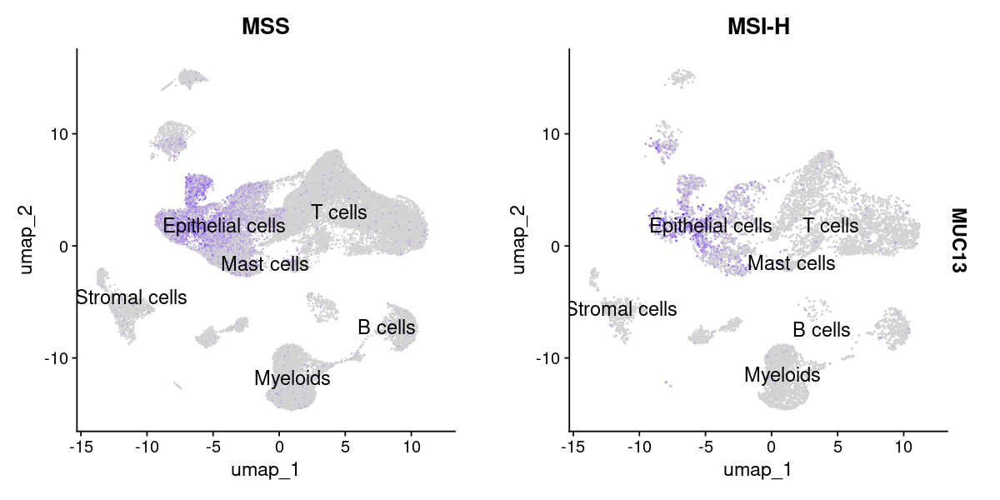

In [66]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
seu_obj_cancer$MSI <- factor(seu_obj_cancer$MSI, levels = c('MSS', 'MSI-H'))
for(gene in  c( 'MUC13')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5))
  
}

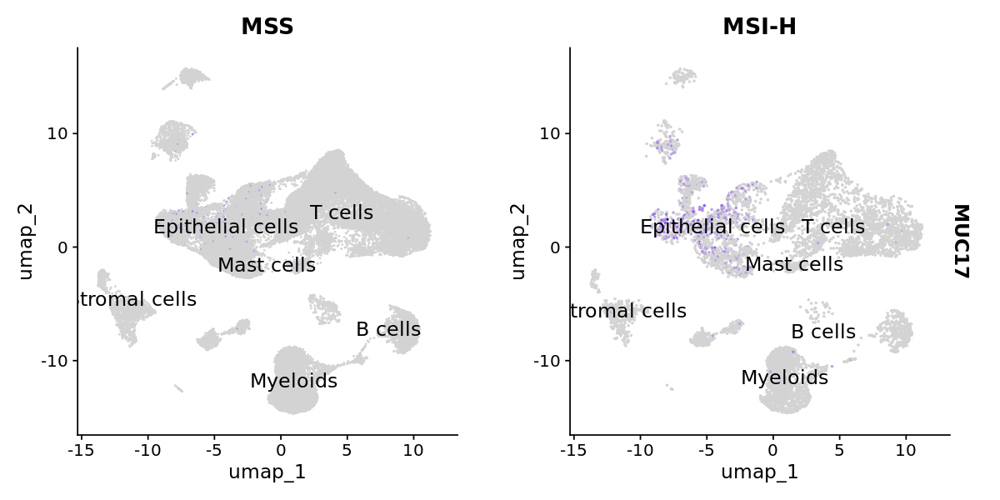

In [19]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
seu_obj_cancer$MSI <- factor(seu_obj_cancer$MSI, levels = c('MSS', 'MSI-H'))
for(gene in  c( 'MUC17')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5))
  
}

In [56]:
plot.df

Var1,Freq
<fct>,<dbl>
CD19+CD20+ B,0.4201681
CD8+ T cells,0.4201681
Stromal 3,0.4201681
Stromal 1,0.8403361
SPP1+,1.2605042
CMS3,1.6806723
Unknown,3.7815126
Stromal 2,7.1428571
Myofibroblasts,84.0336134


In [64]:
table(seu_obj_cancer$MSI)


MSI-H   MSS 
 7442 39811 

In [81]:
seu_obj_cancer@meta.data %>% select(Patient, SMAD4) %>% unique() %>% {table(.$SMAD4)}


  Mutant Wildtype 
       4       19 

In [82]:
table(seu_obj_cancer$SMAD4)


  Mutant Wildtype 
    6947    40306 

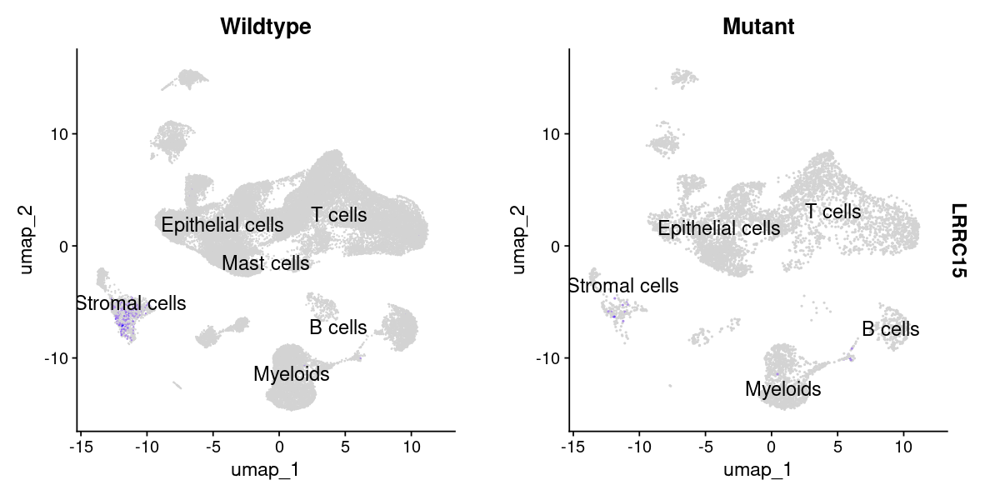

In [89]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
seu_obj_cancer$SMAD4 <- factor(seu_obj_cancer$SMAD4, levels = c('Wildtype', 'Mutant'))
for(gene in  c( 'LRRC15')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'SMAD4',  label = T, label.size = 5))
  
}

In [23]:
table(df$Class)


Normal  Tumor 
     0   7442 

In [23]:
# mss_obj <- subset(seu_obj_filtered, MSI == 'MSS' )
# mss_obj

mss_obj <- subset(seu_obj_filtered, (MSI == 'MSS') & (Class == 'Tumor'))
msi_obj <- subset(seu_obj_filtered, (MSI == 'MSI-H') & (Class == 'Tumor'))

In [24]:
length(unique(mss_obj$Patient))

[1] 19

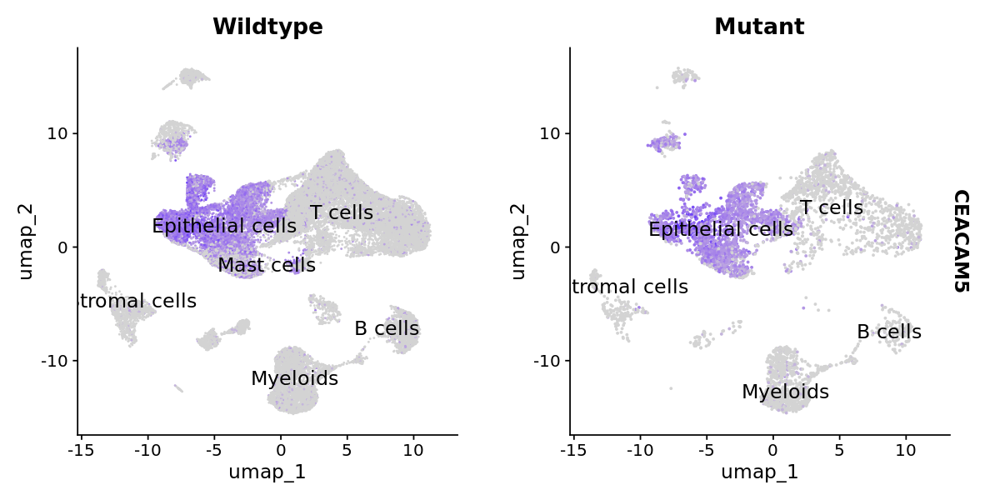

In [25]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(mss_obj) <- 'Cell_type'
mss_obj$SMAD4 <- factor(mss_obj$SMAD4, levels = c('Wildtype', 'Mutant'))
for(gene in  c( 'CEACAM5')){
  
  print(FeaturePlot(mss_obj, features = gene, split.by = 'SMAD4',  label = T, label.size = 5))
  
}

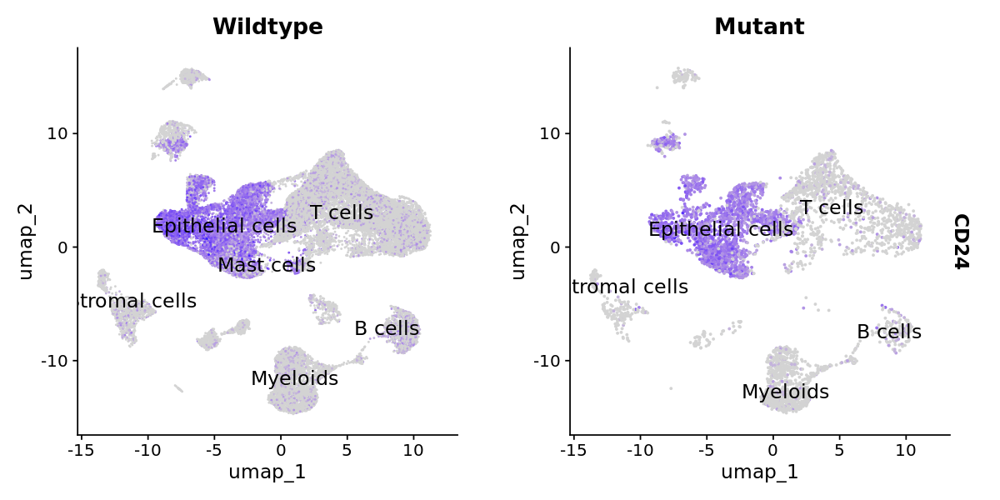

In [21]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(mss_obj) <- 'Cell_type'
mss_obj$SMAD4 <- factor(mss_obj$SMAD4, levels = c('Wildtype', 'Mutant'))
for(gene in  c( 'CD24')){
  
  print(FeaturePlot(mss_obj, features = gene, split.by = 'SMAD4',  label = T, label.size = 5))
  
}

In [41]:
# Extract the lognormazed expression matrix 
gene_list <- c('LY6E', 'TACSTD2')

cnt <- GetAssayData(object = mss_obj, slot = "data")[gene_list, ]

cnt <- as.data.frame(t(cnt))

df = merge(mss_obj@meta.data, cnt, by = 'row.names')


write.table(df, "data/MSS_count_matrix.LY6E_TROP2.tsv", quote = F,
           col.names =T, row.names = F, append = F, sep = "\t")

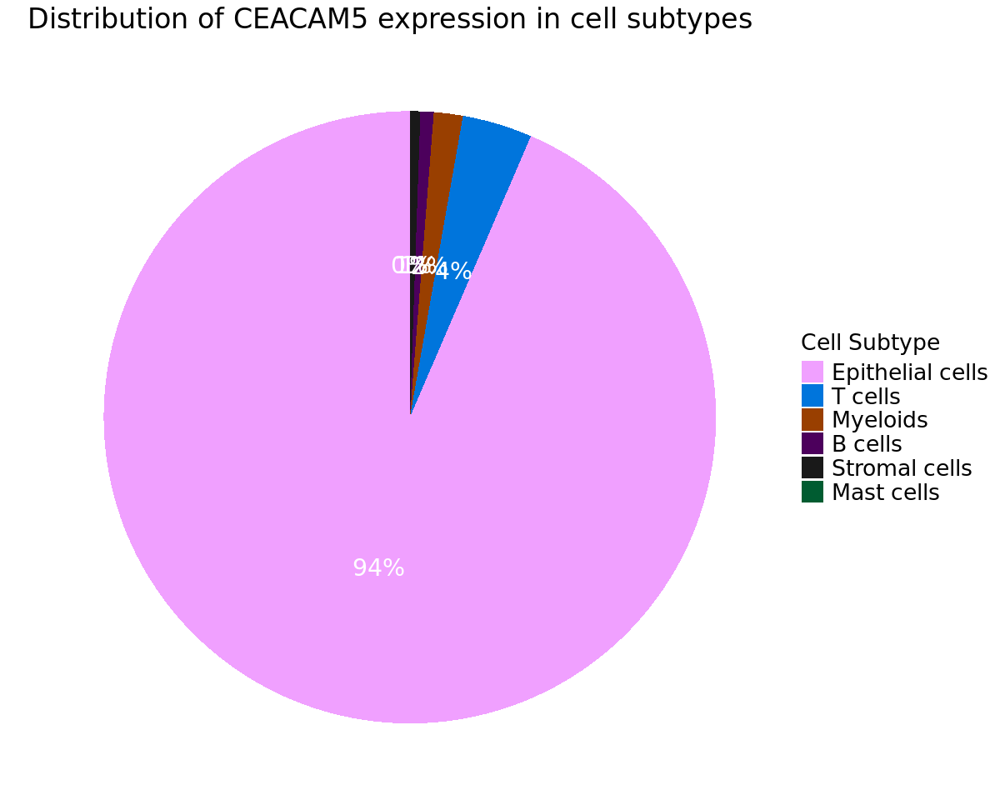

In [33]:
options(repr.plot.width = 10, repr.plot.height = 8)
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'CEACAM5'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

df.Cancer <- df %>%   
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)


plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100


cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)


# plot.df <- plot.df %>% filter(Freq > 0.5)
plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=20),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=16)) 
 
print(p1) 

In [62]:
table(seu_obj_filtered$MSI)


MSI-H   MSS 
12198 51440 

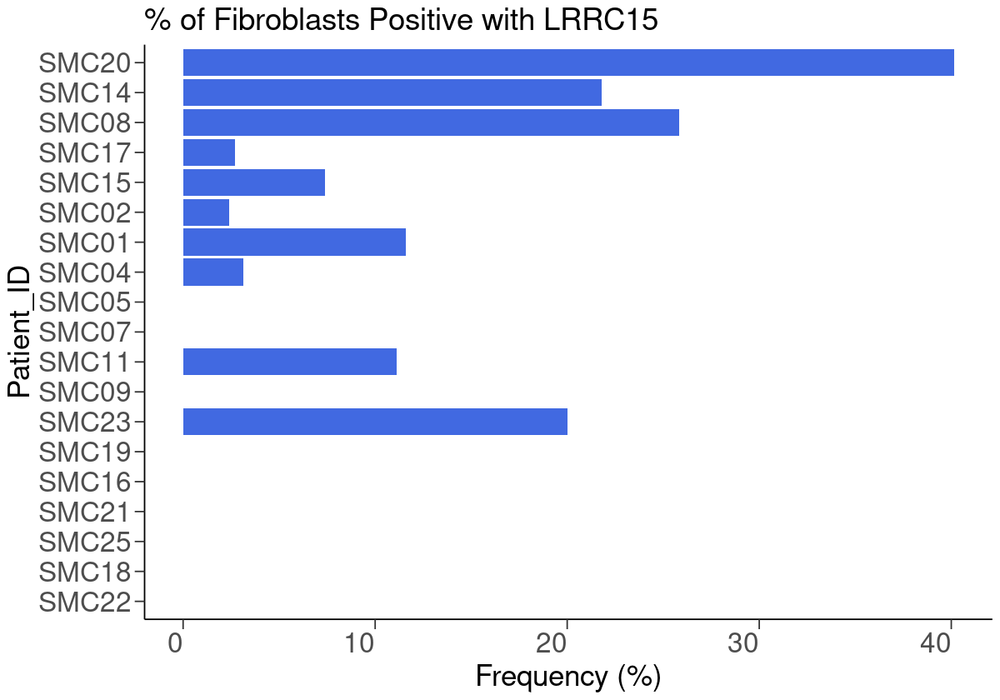

In [75]:
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'LRRC15'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.mss.df2 <- df %>% filter(Cell_subtype == 'Myofibroblasts') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.mss.df2$Freq <- plot.mss.df2$Freq *100
plot.mss.df2$Patient <- factor(plot.mss.df2$Patient, levels = patients.sorted)

ggplot(plot.mss.df2, aes(x = Patient, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# scale_fill_manual(name="Cell_subtype", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts Positive with LRRC15'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22)) 

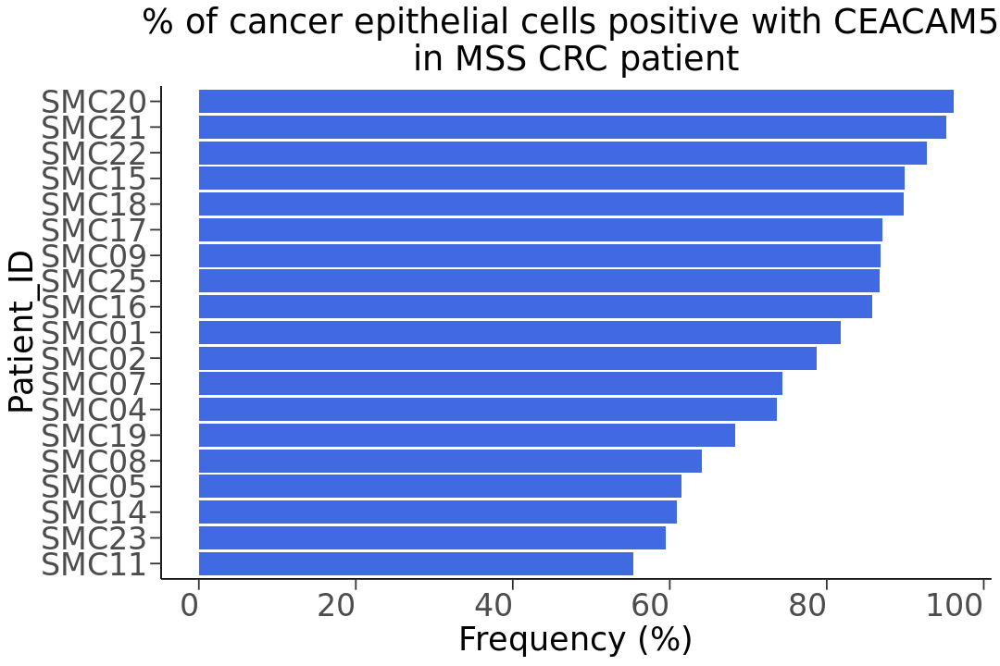

In [38]:
options(repr.plot.width = 9, repr.plot.height = 6)

gene_of_interest <- 'CEACAM5'

gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.mss.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.mss.df2$Freq <- plot.mss.df2$Freq *100

patients.sorted <- plot.mss.df2 %>% arrange(Freq) %>% pull(Patient)

plot.mss.df2$Patient <- factor(plot.mss.df2$Patient, levels = patients.sorted)

ggplot(plot.mss.df2, aes(x = Patient, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# ylim(0, 110) +
scale_y_continuous(breaks = seq(0, 100, by = 20)) +
# scale_fill_manual(name="Cell_type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer epithelial cells positive with {gene_of_interest} \nin MSS CRC patient'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 0.5)) 

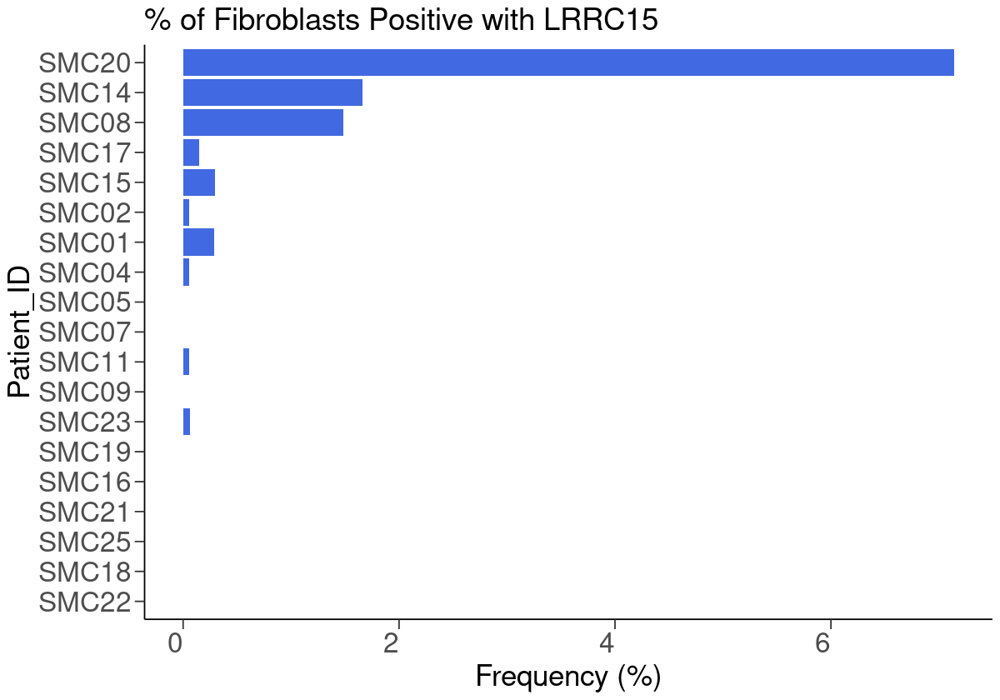

In [76]:
plot.mss.df3 <- merge(plot.mss.df1, plot.mss.df2, by = 'Patient')
plot.mss.df3$Freq2 <- (plot.mss.df3$freq * plot.mss.df3$Freq)/100
plot.mss.df3$Patient <- factor(plot.mss.df3$Patient, levels = patients.sorted)
plot.mss.df3$Cell_subtype <- gsub('CMS1|CMS2|CMS3|CMS4', 'Epithelial cells', plot.mss.df3$Cell_subtype)

ggplot(plot.mss.df3, aes(x = Patient, y = Freq2)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# scale_fill_manual(name="Cell_subtype", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts Positive with LRRC15'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22)) 

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”


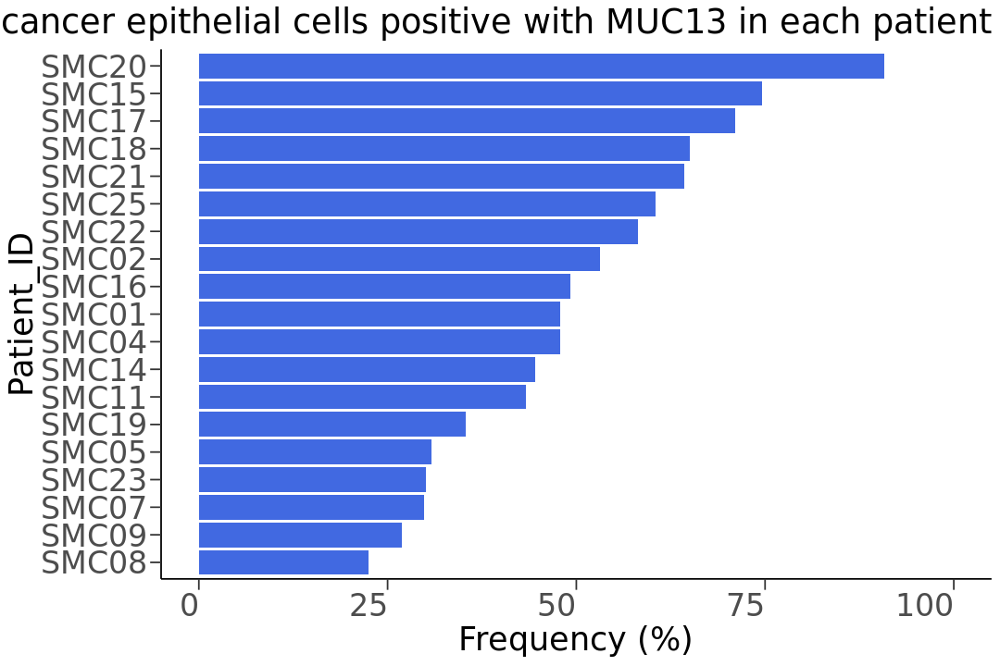

In [23]:
options(repr.plot.width = 9, repr.plot.height = 6)
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'MUC13'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.mss.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.mss.df2$Freq <- plot.mss.df2$Freq *100

patients.sorted <- plot.mss.df2 %>% arrange(Freq) %>% pull(Patient)

plot.mss.df2$Patient <- factor(plot.mss.df2$Patient, levels = patients.sorted)

ggplot(plot.mss.df2, aes(x = Patient, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
ylim(0, 100) +
# scale_fill_manual(name="Cell_type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer epithelial cells positive with MUC13 in each patient'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 1)) 

In [37]:
mss_obj

An object of class Seurat 
50207 features across 39811 samples within 2 assays 
Active assay: SCT (24552 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

In [ ]:
# Extract the lognormazed expression matrix for CCR8 and FOXP3
gene_list <- c('LRRC15', 'CTSB', 'CTSL', 'FAP', 'MKI67', 'CD274', 'PDCD1')

cnt <- GetAssayData(object = seu_obj_filtered, slot = "data")[gene_list, ]

cnt <- as.data.frame(t(cnt))

df = merge(seu_obj_filtered@meta.data, cnt, by = 'row.names')


write.table(df, "data/CRC_count_matrix.LRRC15_Cathepsins_FAP_KI67_CD274_PDCD1.tsv", quote = F,
           col.names =T, row.names = F, append = F, sep = "\t")

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”


In [20]:
tumor_obj <- subset(seu_obj_filtered, Class == 'Tumor')

In [51]:
options(repr.plot.width = 9, repr.plot.height = 6)
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
G <- 'MUC13'
gene_exp_sub <- gene_exp[G, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.mss.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.mss.df2$Freq <- plot.mss.df2$Freq *100

plot.mss.df2$hgnc_symbol <- G
plot.mss.df2 <- plot.mss.df2 %>% select(Patient, hgnc_symbol, Freq)

plot.mss.df2


Patient,hgnc_symbol,Freq
<chr>,<chr>,<dbl>
SMC01,MUC13,47.89377
SMC02,MUC13,53.12500
SMC04,MUC13,47.88274
SMC05,MUC13,30.76923
SMC07,MUC13,29.88930
SMC08,MUC13,22.50000
SMC09,MUC13,26.86804
SMC11,MUC13,43.38462
SMC14,MUC13,44.57831


In [42]:
genes <- c('CEACAM5', 
         'EGFR', 'VEGFA', 'KDR', 'ERBB2', 
         'MET', 
         'LAG3', 'CD276')
gene_exp <- GetAssayData(object = mss_obj, slot = "data")



In [43]:
plot_df <- NULL

for(G in genes){
    # G <- 'MUC13'
    gene_exp_sub <- gene_exp[G, ] %>% as.data.frame()
    names(gene_exp_sub) <- 'Gene_exp'
    gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
    df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')
    
    plot.mss.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
    summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
    plot.mss.df2$Freq <- plot.mss.df2$Freq *100
    
    plot.mss.df2$hgnc_symbol <- G
    plot.mss.df2 <- plot.mss.df2 %>% select(Patient, hgnc_symbol, Freq)
    plot_df <- rbind(plot_df, plot.mss.df2)
    }

In [44]:
head(plot_df)

Patient,hgnc_symbol,Freq
<chr>,<chr>,<dbl>
SMC01,CEACAM5,81.77656
SMC02,CEACAM5,78.69318
SMC04,CEACAM5,73.61564
SMC05,CEACAM5,61.53846
SMC07,CEACAM5,74.35424
SMC08,CEACAM5,64.06250


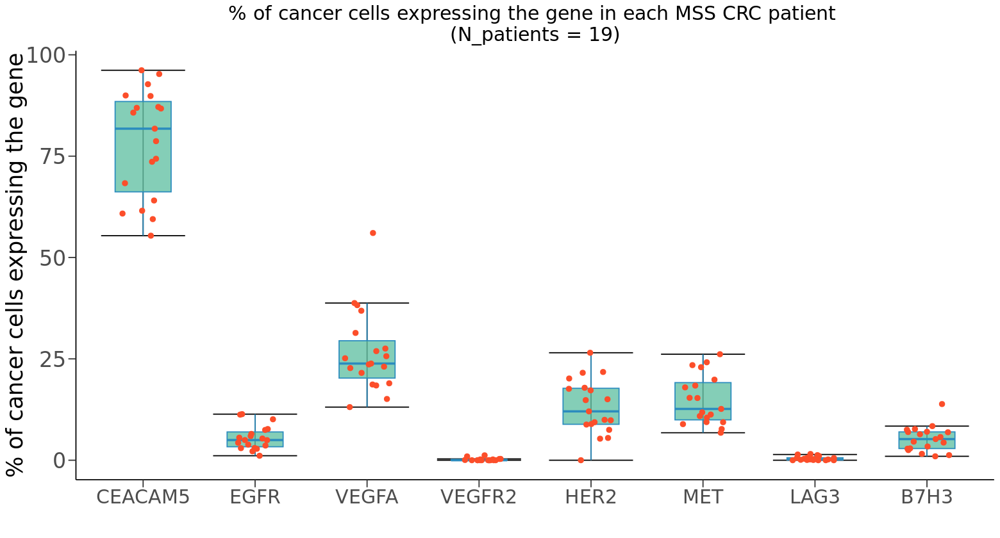

In [49]:
options(repr.plot.width = 13, repr.plot.height = 7)
genes <- gsub('KDR', 'VEGFR2', genes)
genes <- gsub('ERBB2', 'HER2', genes)
genes <- gsub('CD276', 'B7H3', genes)

plot_df$hgnc_symbol <- gsub('KDR', 'VEGFR2', plot_df$hgnc_symbol)
plot_df$hgnc_symbol <- gsub('ERBB2', 'HER2', plot_df$hgnc_symbol)
plot_df$hgnc_symbol <- gsub('CD276', 'B7H3', plot_df$hgnc_symbol)

plot_df$hgnc_symbol <- factor(plot_df$hgnc_symbol, levels = genes)

ggplot(plot_df, aes(x = hgnc_symbol, y = Freq)) +
stat_boxplot(geom ='errorbar') + 
       geom_boxplot(fill="#66C2A5", color="#2B8CBE", alpha=0.8, width = 0.5, outliers = F) + 
  geom_jitter(width=0.2, colour = "#FC4E2A", size = 2) +

# coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer cells expressing the gene in each MSS CRC patient \n(N_patients = 19)'),
        x = "",
        y = "% of cancer cells expressing the gene") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 18),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18, hjust = 0.5)) +
guides(fill = guide_legend(reverse = TRUE))

In [18]:
# tumor_obj <- subset(seu_obj_filtered, Class == 'Tumor')

In [23]:
tumor_obj 

An object of class Seurat 
50207 features across 47253 samples within 2 assays 
Active assay: SCT (24552 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

In [19]:
Idents(tumor_obj) <- "Cell_type"

Warning message:
“The `slot` argument of `FetchData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”


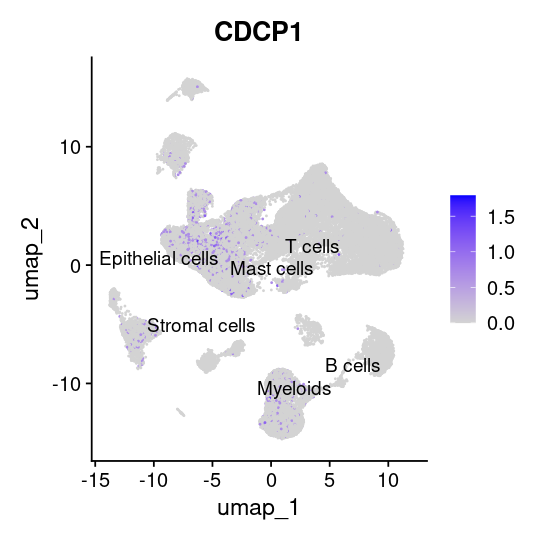

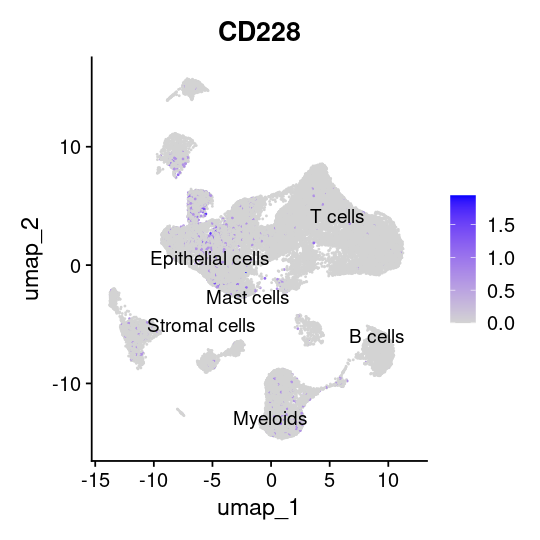

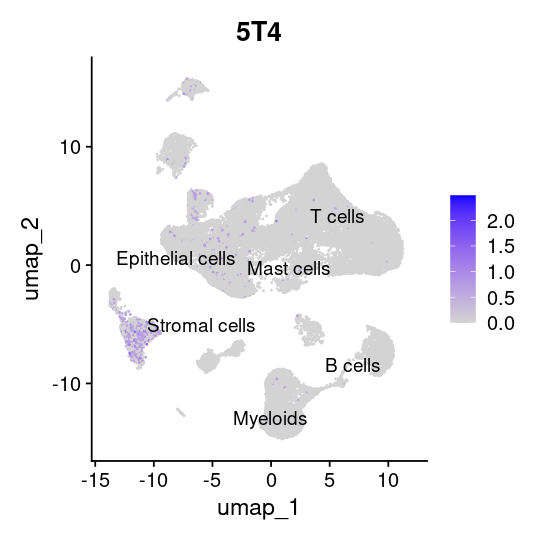

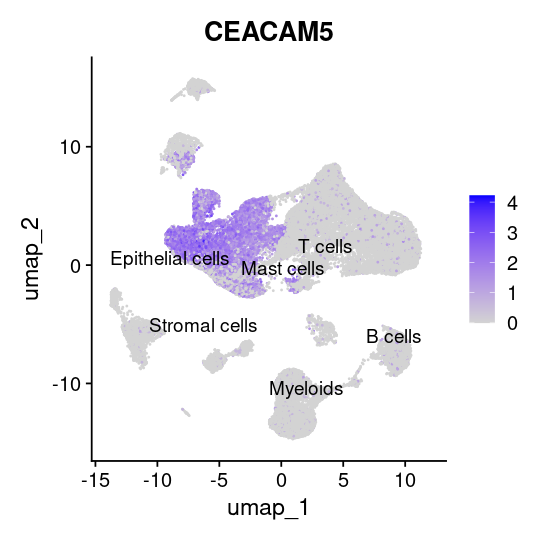

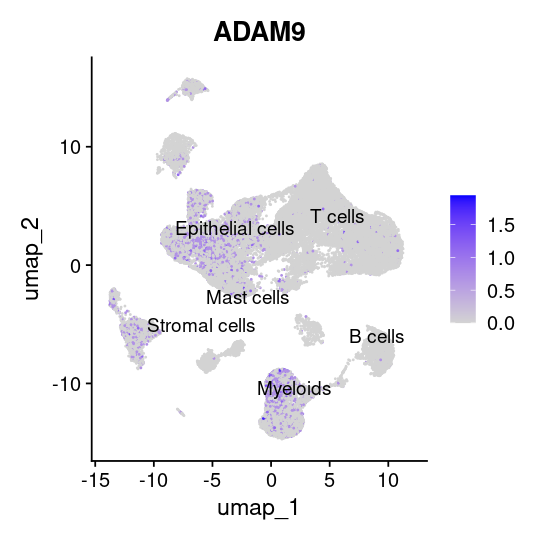

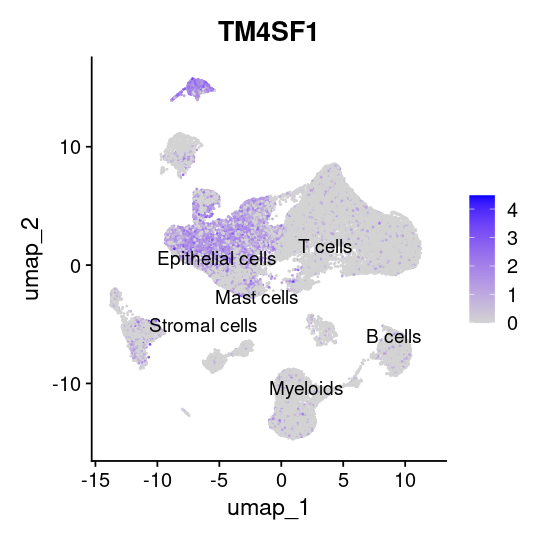

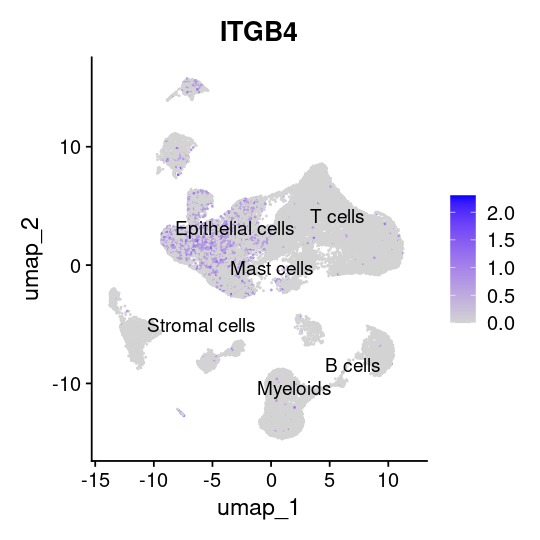

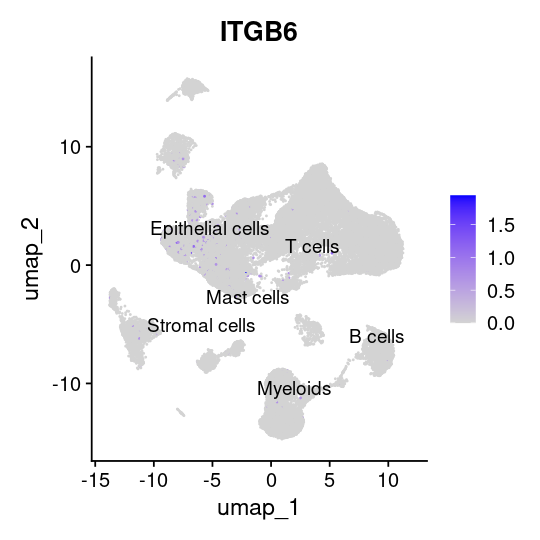

In [15]:
options(repr.plot.width = 4.5, repr.plot.height = 4.5)
options(ggrepel.max.overlap = 25)

for(gene in c('CDCP1', 'MFI2', 'TPBG', 'CEACAM5', 'ADAM9', 'TM4SF1', 'ITGB4', 'ITGB6')){
  p <- FeaturePlot(tumor_obj, features = gene, label = TRUE, repel = TRUE)
  
  if(gene == 'MFI2') {
    p <- p + ggtitle('CD228')
  } else if(gene == 'TPBG') {
    p <- p + ggtitle('5T4')
  }
  
  print(p) # This explicit print is crucial
     # Sys.sleep(0.1)
  
}

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”


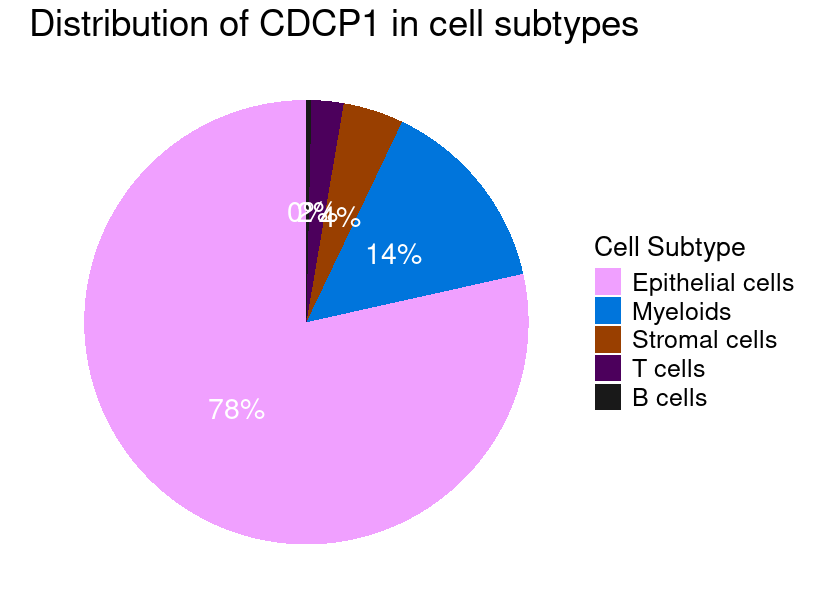

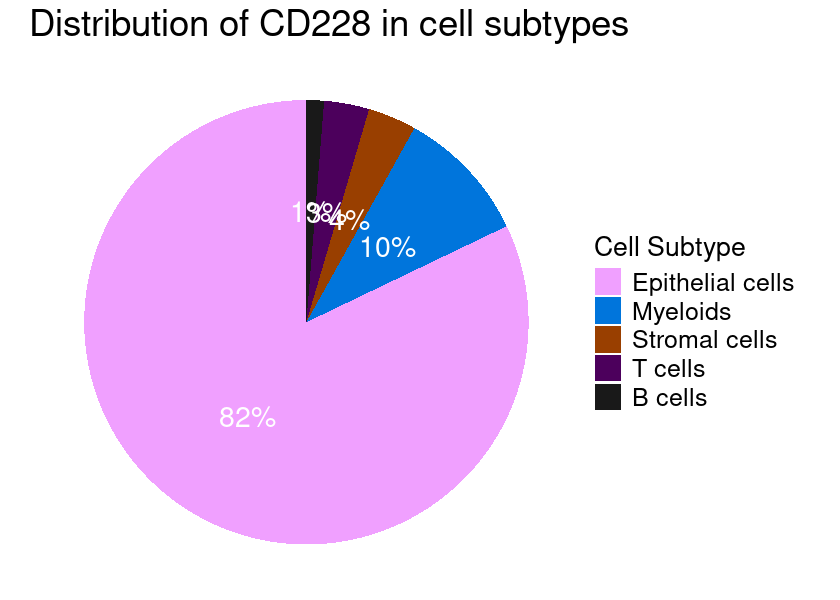

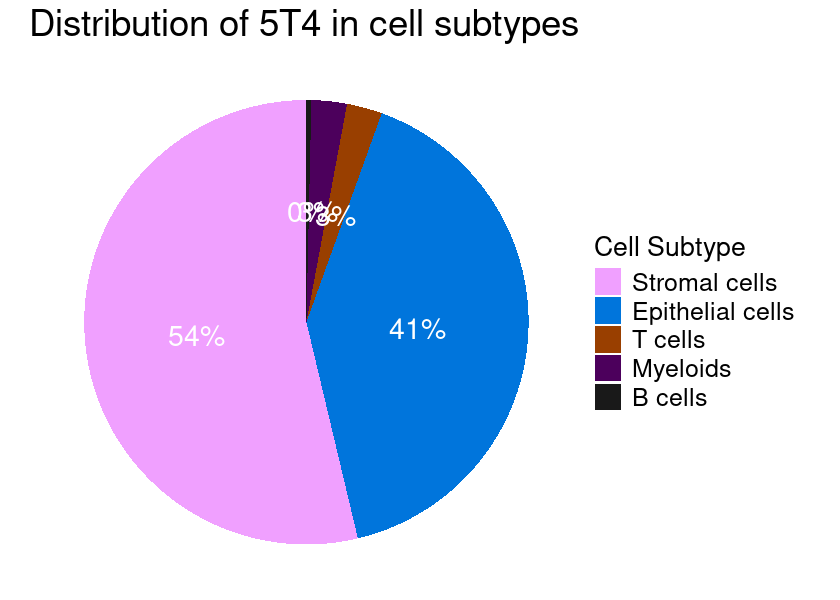

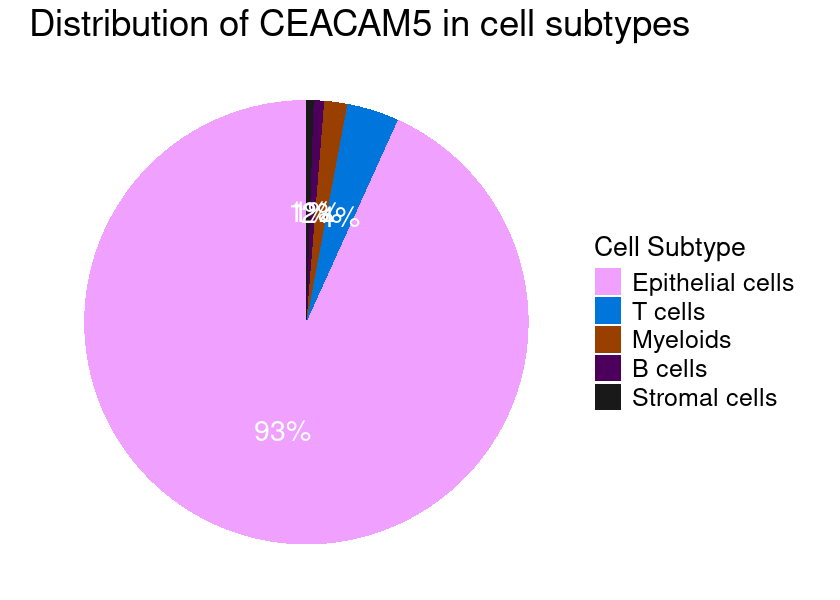

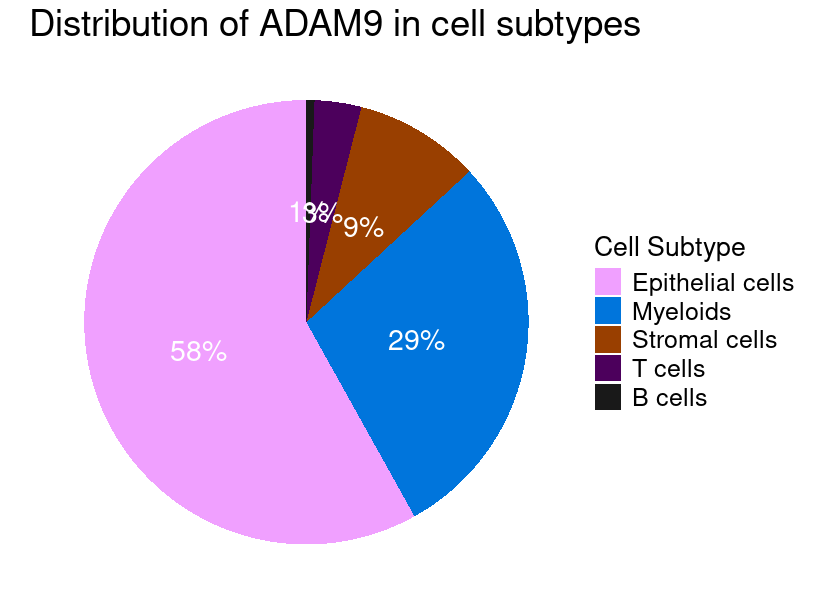

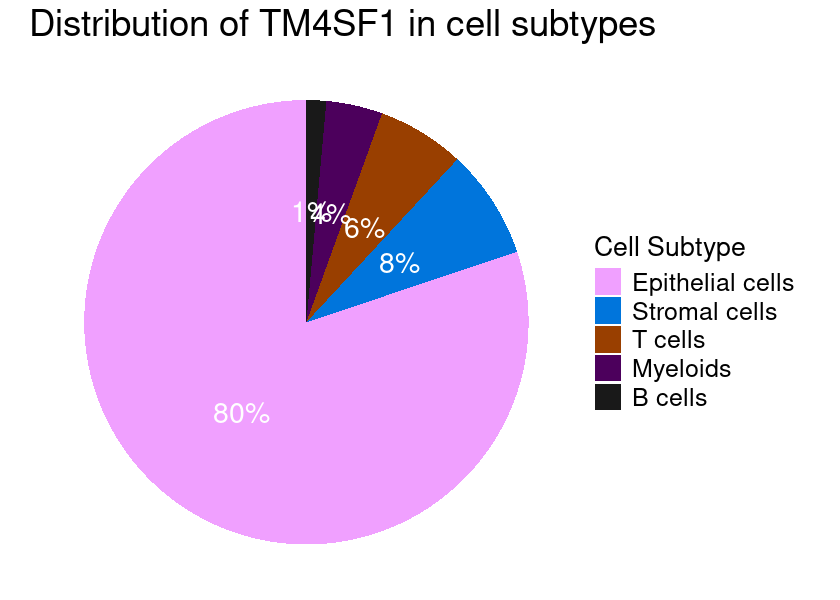

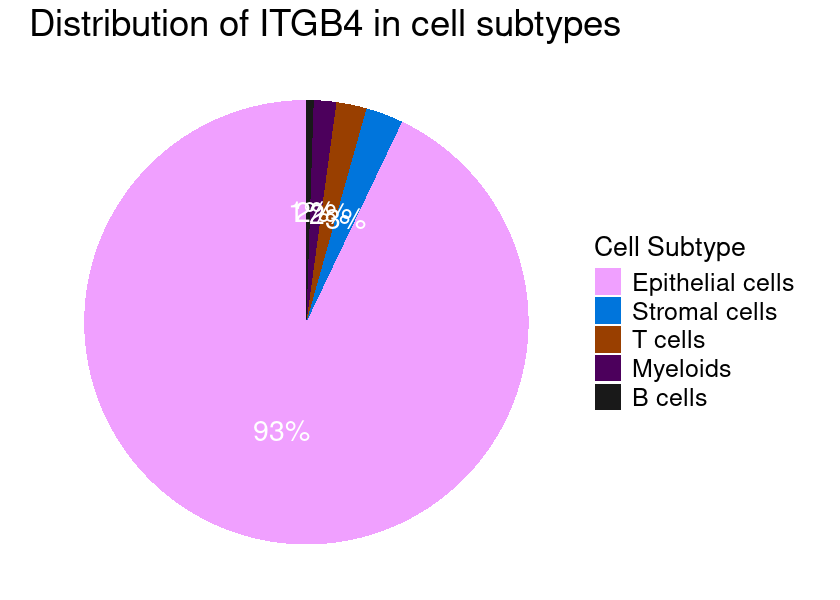

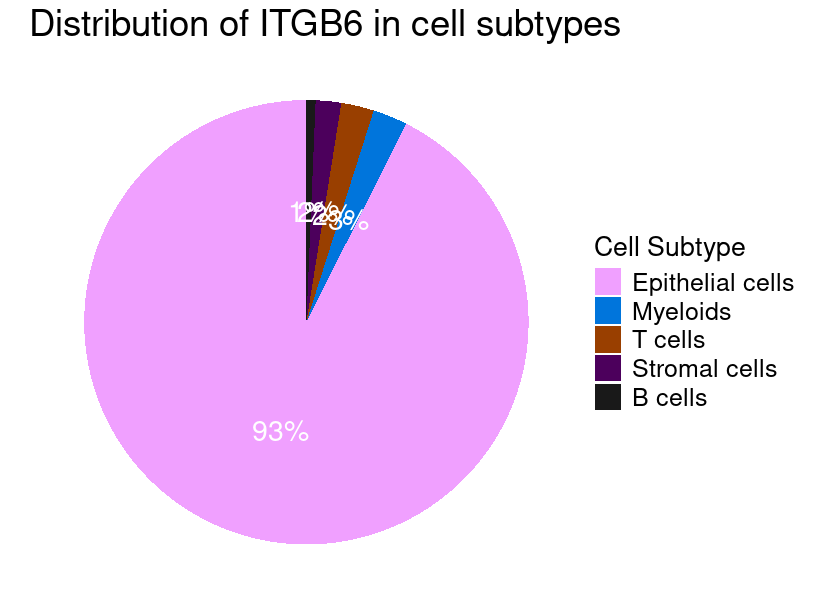

In [16]:
gene_exp <- GetAssayData(object = tumor_obj, slot = "data")
# gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

for(gene_of_interest in c('CDCP1', 'MFI2', 'TPBG', 'CEACAM5', 'ADAM9', 'TM4SF1', 'ITGB4', 'ITGB6')){
# cell_type <- ''
    if(gene_of_interest == 'MFI2'){
        gene_label <- 'CD228'
    }else if(gene_of_interest == 'TPBG'){
        gene_label <- '5T4'
    }else{
        gene_label <- gene_of_interest
    }
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% 
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)
# cell.sorted <- levels(df.Cancer$Cell_Type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)
plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")

p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_label} in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 
    }

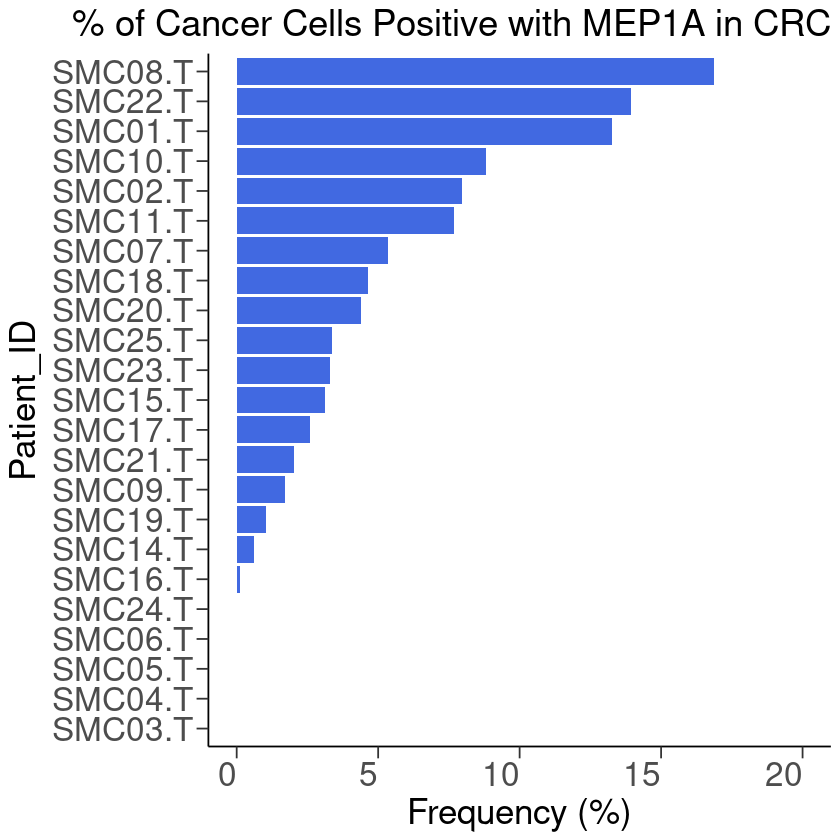

In [34]:
options(repr.plot.width = 7, repr.plot.height = 7)

gene_of_interest <- 'MEP1A'

cell_type <- c('Epithelial cells')
gene_exp <- GetAssayData(object = tumor_obj, slot = "data")
# gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.df2 <- df %>% filter(Cell_type %in% cell_type) %>% group_by(orig.ident) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.df2$Freq <- plot.df2$Freq *100
patients.sorted <- plot.df2 %>% arrange(Freq) %>% pull(orig.ident)
plot.df2$orig.ident <- factor(plot.df2$orig.ident, levels = patients.sorted)

ggplot(plot.df2, aes(x = orig.ident, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# scale_fill_manual(name="Cell_Type", values=colors) + 
scale_y_continuous(limits = c(0, 20)) +
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Cancer Cells Positive with {gene_of_interest} in CRC'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 1)) 

In [36]:
seu_obj_cancer

An object of class Seurat 
50207 features across 47253 samples within 2 assays 
Active assay: SCT (24552 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

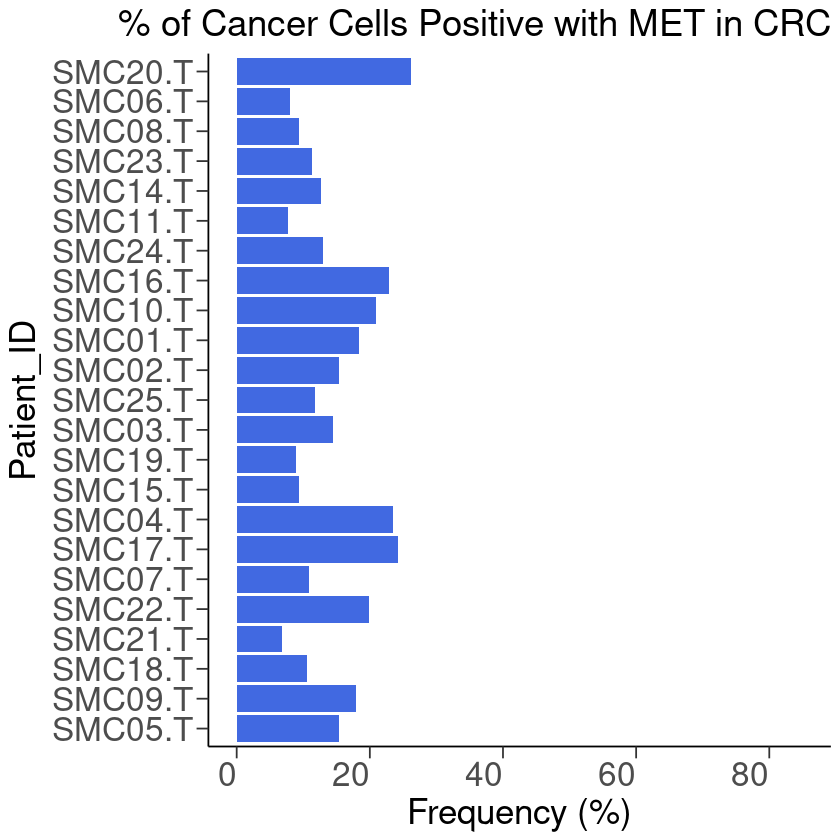

In [35]:
options(repr.plot.width = 7, repr.plot.height = 7)

gene_of_interest <- 'MET'

cell_type <- c('Epithelial cells')
gene_exp <- GetAssayData(object = tumor_obj, slot = "data")
# gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.df2 <- df %>% filter(Cell_type %in% cell_type) %>% group_by(orig.ident) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.df2$Freq <- plot.df2$Freq *100
# patients.sorted <- plot.df2 %>% arrange(Freq) %>% pull(orig.ident)
plot.df2$orig.ident <- factor(plot.df2$orig.ident, levels = patients.sorted)

ggplot(plot.df2, aes(x = orig.ident, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# scale_fill_manual(name="Cell_Type", values=colors) + 
scale_y_continuous(limits = c(0, 85)) +
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Cancer Cells Positive with {gene_of_interest} in CRC'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 1)) 

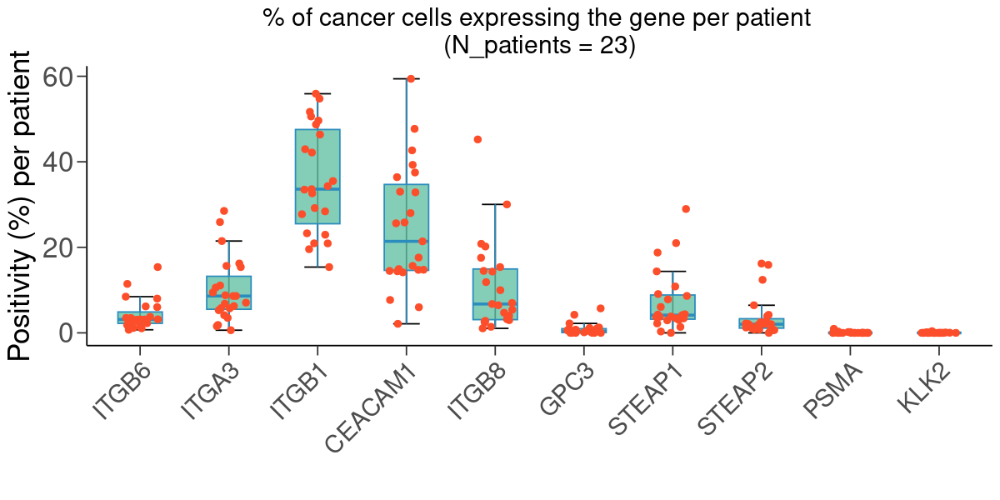

In [31]:

# genes <- c('ITGA3', 'ITGB1', 'STEAP1', 'STEAP2', 'CEACAM1', 
#                'ITGB8', 'GPC3', 'PSMA1', 'KLK2')
genes <- c('ITGB6', 'ITGA3', 'ITGB1', 'CEACAM1', 
               'ITGB8', 'GPC3', 'STEAP1', 'STEAP2', 'FOLH1', 'KLK2')
gene_dict <- c('FOLH1' = 'PSMA')

gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

plot_df <- NULL

for(G in genes){
    # G <- 'MUC13'
    if(G %in% rownames(gene_exp)){
    gene_exp_sub <- gene_exp[G, ] %>% as.data.frame()
    names(gene_exp_sub) <- 'Gene_exp'
    gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
    df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')
    
    plot.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(orig.ident) %>%
    summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
    plot.df2$Freq <- plot.df2$Freq *100
    
    plot.df2$hgnc_symbol <- G
    plot.df2 <- plot.df2 %>% select(orig.ident, hgnc_symbol, Freq)
    plot_df <- rbind(plot_df, plot.df2)
    }
}
n_patients <- length(unique(plot_df$orig.ident))

genes <- recode(genes, !!!gene_dict)
plot_df$hgnc_symbol <- dplyr::recode(plot_df$hgnc_symbol, !!!gene_dict)

plot_df$hgnc_symbol <- factor(plot_df$hgnc_symbol, levels = genes)

options(repr.plot.width = 10, repr.plot.height = 5)
ggplot(plot_df, aes(x = hgnc_symbol, y = Freq)) +
stat_boxplot(geom ='errorbar', width = 0.3) + 
       geom_boxplot(fill="#66C2A5", color="#2B8CBE", alpha=0.8, width = 0.5, outliers = F) + 
  geom_jitter(width=0.2, colour = "#FC4E2A", size = 2) +

# coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer cells expressing the gene per patient \n(N_patients = {n_patients})'),
        x = "",
        y = "Positivity (%) per patient") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 18, angle = 45, hjust = 1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18, hjust = 0.5)) +
guides(fill = guide_legend(reverse = TRUE))




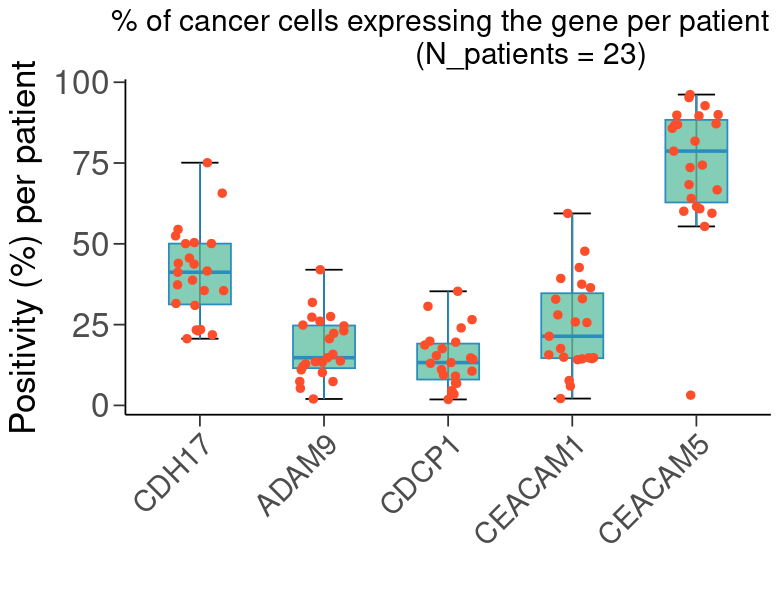

In [24]:
# CDH17, ADAM9, CDCP1, CEACAM1 RNA expression in CRC compared to CEACAM5
# genes <- c('ITGA3', 'ITGB1', 'STEAP1', 'STEAP2', 'CEACAM1', 
#                'ITGB8', 'GPC3', 'PSMA1', 'KLK2')
# genes <- c('ITGB6', 'ITGA3', 'ITGB1', 'CEACAM1', 
#                'ITGB8', 'GPC3', 'STEAP1', 'STEAP2', 'FOLH1', 'KLK2')
# gene_dict <- c('FOLH1' = 'PSMA')

genes <- c('CDH17', 'ADAM9', 'CDCP1', 'CEACAM1', 'CEACAM5')
gene_dict <- c('FOLH1' = 'PSMA')


gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

plot_df <- NULL

for(G in genes){
    # G <- 'MUC13'
    if(G %in% rownames(gene_exp)){
    gene_exp_sub <- gene_exp[G, ] %>% as.data.frame()
    names(gene_exp_sub) <- 'Gene_exp'
    gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
    df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')
    
    plot.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(orig.ident) %>%
    summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
    plot.df2$Freq <- plot.df2$Freq *100
    
    plot.df2$hgnc_symbol <- G
    plot.df2 <- plot.df2 %>% select(orig.ident, hgnc_symbol, Freq)
    plot_df <- rbind(plot_df, plot.df2)
    }
}
n_patients <- length(unique(plot_df$orig.ident))

genes <- recode(genes, !!!gene_dict)
plot_df$hgnc_symbol <- dplyr::recode(plot_df$hgnc_symbol, !!!gene_dict)

plot_df$hgnc_symbol <- factor(plot_df$hgnc_symbol, levels = genes)

options(repr.plot.width = 6.5, repr.plot.height = 5)
ggplot(plot_df, aes(x = hgnc_symbol, y = Freq)) +
stat_boxplot(geom ='errorbar', width = 0.3) + 
       geom_boxplot(fill="#66C2A5", color="#2B8CBE", alpha=0.8, width = 0.5, outliers = F) + 
  geom_jitter(width=0.2, colour = "#FC4E2A", size = 2) +

# coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer cells expressing the gene per patient \n(N_patients = {n_patients})'),
        x = "",
        y = "Positivity (%) per patient") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 18, angle = 45, hjust = 1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18, hjust = 0.7)) +
guides(fill = guide_legend(reverse = TRUE))


